# <div align="center"><b>Parameter inference from partial observations of a Lotka-Volterra process</b></div>

**FINAL PROJECT:** MODELS AND ALGORITHMS.

<div style="text-align: right">Collegio Carlo Alberto</div>
<div style="text-align: right">2022-2023</div>
<div style="text-align: left">Group Components</div> 


- Sperti Stefano (Terzo anno di triennale di Matematica per la finanza e l'assicurazione - Erasmus)
- Pisu Maurizio (Terzo anno di triennale di Economia - Erasmus)
- Zannotti Cecilia (Terzo anno di triennale di Matematica - Erasmus)



#  Introduction to the model

In [1]:
using Plots, Statistics
using Printf
using ProgressMeter
using Distributions
using StatsPlots
using StatsBase

The Lotka-Volterra Model is frequently used to describe the dynamics of biological systems in which two species interact. The model is mainly based on two pair of equations: 

$$
\begin{cases}
\frac{dx}{dt} = αx - βxy\\
\frac{dx}{dt} = δxy - γy
\end{cases}
$$
where the $x$ indicates the prays and $y$ the predators. 
The parameter 

α = maximum prey growth rate,

β =  the interaction parameter (how the presence of the pradators affect α),

γ = predator death rate, 

δ  = the interaction parameter (how the presence of the pray affect γ).
 

The prey population depends on how quickly the preys reproduce (α parameter) and on how many specimens die because eaten by the predators (β parameter). Similarly, The predator population depends on how many specimens the predators eat so that they can reproduce (δ parameter) and on how quickly they die (γ parameter).


## Special cases and equilibriums
### One of the two population is 0

In this case we obtain trivial differential equations with the exponential solution. 

* $x(t) = 0 : \frac{dy}{dt} = -γy \rightarrow  y(t) = \exp(-γt)$ . The predators exponentially decrease since they cannot hunt; 

* $y(t) = 0 : \frac{dx}{dt} = αx \rightarrow  x(t) = \exp(αt)$ . The preys exponentially increase since they are not hunted. 


### Equilibrium

We find the equilibrium conditions setting the equations equal to 0. We get 2 possibilities

* $(x(t),y(t)) = (0,0)$ (no specimens, trivial)

* $(x(t),y(t)) = (\frac{γ}{δ},\frac{α}{β})$

In these situations none of the two population has the necessity to increase or decrease.


## Representation

If we consider a graph representing the two populations growth separately depending on the passing of time (2-dimentional representation), we will probably observe some oscillations. 

For a little amount of both predators and preys, the former cannot grow since the latter are not enough to feed all the predators, then the preys have the possibility to grow; as soon as there are preys enough, the predators hunt them and reproduce, so that the predators population increases but the preys one starts decreasing; when the prey population is too little, again, predators don’t have food enough and the population decreases, therefore the number of preys increases. This means we obtain a “periodic” graph for both species, but a bit translated with respect to each other.


This circular trend can also be caught thanks to a 3-dimentional graph: time - prey population - predator population ($t-x(t)-y(t)$). We can represent on a plane the respective quantities of predators and preys at each instant of time. We will probably observe some circular orbits, one for each initial state $(x_0(t),y_0(t))$. 

* Placing on one of them, starting from the bottom left: little amount of both predators and preys; 
 
* as the time passes we move along the orbit to the right: predators are almost stable but preys increase (since there are few predators, the prey can reproduce); 

* up to a certain point, then the predator population starts growing and the preys stop: we are moving to the top (predators are "eating" preys); 

* then the lack of food makes the predators stop growing: we are moving to the left; 

* continues periodically

For a common initial state the orbit lies around the equilibrium point $(\frac{γ}{δ},\frac{α}{β})$ and never touches the axes.

In the special cases

* Equilibriums $(x_0(t),y_0(t)) = (0,0)$ or $(x_0(t),y_0(t)) = (\frac{γ}{δ},\frac{α}{β})$ : the orbit is just the    point, we will not move;  

* $x_0(t) = 0$ : the orbit is the y-axis;

* $y_0(t) = 0$ : the orbit is the x-axis.




# Point 1 : Simulation of Lodka Volterra model
Simulate a dynamical system of this type using a population-based implementation. Study the behavior of the dynamical system when changing  the values of parameters (λ_breed, λ_interaction, λ_death) and identify an interesting regime, i.e. the two species do not face extinction after a few steps of the simulation.

We rely on the SIR-Model to describe our dynamical system.

At every instant each individual of the entire population of size $N$ could be in one of the three states: prey, predator, dead.

At instant ${t}$:

* $N_S^{t}$ = number of preys

* $N_I^{t}$ = number of predators

* $N_R^{t}$ = number of deads

Preys grow due to the factor $λ_{breed}$ or change their state becoming predators due to the factor $λ_{interaction}$.

Predators grow due to the factor $λ_{interaction}$, because killing preys they can reproduce, or die and change their state becoming deads due to the factor $λ_{death}$.
Here we are also assuming that in our time discretization predators have no limits in reproducing, at each instant $t$ they can reproduce more than once. 

While we consider deads as an absorbing state.

At instant ${t+1}$:

* the number of new preys is $λ_{breed} N_S^{t}$

* the number of new predators is $1 - (1 - λ_{interaction})^I N_S^{t}$. 
This derives from the fact that if a prey died it becomes a predator and, since the predator could reproduce multiple times in the some interval, then we can think at the new predators as the prey that died in that iteration. Indeed, $1 - (1 - λ_{interaction})^I$ is the probability of dying.

* the number of new deads is $λ_{death} N_I^{t}$

We consider our model at which a new element can enter in the sistem as a prey with probability: $1 - (1 - λ_{breed})^S$. At each iteration each element follows the following transiction matrix:

\begin{bmatrix}
(1 - λ_{interaction})^I & 1 - (1 - λ_{interaction})^I & 0\\
0 & 1-λ_{death} & λ_{death} \\
0 & 0 &1
\end{bmatrix}


If the equilibrium points are reached during a simulation, they would stop the evolution of the model since there would not be any new changes.

Whenever the simulation reaches a situation $x(t) = 0$ (the graph touches the y-axis) all the specimens would die in a finite time: there are no preys left and predators gradually disappear since they have no new borns. 

Whenever the simulation reaches a situation $y(t) = 0$ (the graph touches the x-axis) the prey population would grow to infinite: there are no predators left hunting them.

In all these cases we stop the process and we consider the simulation not having gone well.



In [2]:
#Hyperparameters
M = 10 #number of scenario
N = 200 #population size (prays + predators)
max_time = 500 #maximum time of the simulation

Deterministi_pz = true #Deterministic or probabilistic starting point
p = 0.25 #probability to be in the first step a predator

0.25

In [3]:
#Plots
plot1 = nothing
plot2 = nothing
plot3 = nothing
plot4 = nothing
plot5 = nothing
plot6 = nothing

In [4]:
#Deterministic or probabilistic starting point

if Deterministi_pz == true
    pz = 50
else
    d = Binomial(1,p) #Generate th(1,p) e number of the predator in the initial stateial(1,p)
    pz_bool = rand(d,N)
    pz = sum(pz_bool)
end
    


50

### Definition of the function

This function defines the Lotka-Volterra model.

In [5]:
#Assuming that the predator can reproduce more than once, define the function that describes our model
# S = Preys
# I = Predators 
# R = Deads

#Assuming that the predator can reproduce more than one time each iteration, define the function that describes our model
function lotka_volterra(N::Int, λ_interaction::Float64, λ_breed::Float64, λ_death::Float64, max_time::Int, pz::Int)
    #Initial situation
    S, I, R = N - pz, pz, 0
    nS, nI, nR = [S], [I], [R]
    
    for t in 2:max_time
        ΔS, ΔI, ΔR = 0, 0, 0
        pI = 1 - (1 - λ_interaction)^I
        
        # Predator reproduces == pray dies
        ΔI += rand(Binomial(S, pI))
        
        # Predator dies
        ΔR += rand(Binomial(I, λ_death))
        
        # Pray new borns
        ΔS += rand(Binomial(S, λ_breed))

        # Update the data
        S, I, R = max(0, S + ΔS - ΔI), max(0, I + ΔI - ΔR), max(0, R + ΔR)
        
        # Add to the initial structure
        push!(nS, S)
        push!(nI, I)
        push!(nR, R)
    end
    
    return (nS = nS, nI = nI, nR = nR)
end


lotka_volterra (generic function with 1 method)

This function breaks the simulation if there is extintion of one of the two populations.

In [6]:
function Lodka_num_parameter(_simN::Int, λ_interaction::Float64, λ_breed::Float64, λ_death::Float64, max_time::Int, pz::Int)

    S = N - pz
    I = pz
    R = 0
    newI = 0
    bornS = 0
    t = 0

    nS = []
    nI = []
    nR = []
    Inew = []
    Snew =[]

    t +=1
    newI = 0 
    newR = 0
    newS = 0
    ΔI = 0

    #nS = [S]
    #nI = [I]
    #nR = [R]
    #Inew = [0]
    #Snew = [0]

    while (t < max_time && S > 0 && I > 0 &&  S < 2000 && I < 2000)


        S += newS
        S -= newI
        I += newI
        I -= newR
        R += newR
        
        # update the state of the new preys
        # update the state of the new predators
        # update the state of the number of deads

        push!(nS, S)
        push!(nI, I)
        push!(nR, R)
        push!(Inew,newI)
        push!(Snew,newS)

        t +=1
        newI = 0 
        newR = 0
        newS = 0
        ΔI = 0
        
        
        prob = (1 -((1-λ_interaction)^(I)))
        newI=rand(Binomial(S,prob))
        newR=rand(Binomial(I,λ_death))
        newS=rand(Binomial(S,λ_breed))


        
        
    
    end

    #if t < max_time
    #    @show "One of the population extinguished or there is divergence"
    #    @show S
    #    @show I
    #end

    #if t >= max_time
    #    @show "The simulation went well"
    #    @show λ_interaction
    #    @show λ_death
    #    @show λ_breed
    #end

    return (nS=nS, nI=nI, nR=nR, nInew=Inew, nSnew = Snew, time = t)

end

Lodka_num_parameter (generic function with 1 method)

This function is created to implement plot and for this reason if one of the populations converges to 0 the fuction continues to work and it stops only if one of the population diverges.

In [7]:
function Lodka_num_plot(_simN::Int, λ_interaction::Float64, λ_breed::Float64, λ_death::Float64, max_time::Int, pz::Int)

    div = 0
    div = true
    
    S = N - pz
    I = pz
    R = 0
    newI = 0
    
    nS = []
    nI = []
    nR = []
    Inew = []
    t = 2

    while div
        S = N - pz
        I = pz
        R = 0
        newI = 0

        t = 2
        nS = []
        nI = []
        nR = []
        Inew = []
        push!(nS, S)
        push!(nI, I)
        push!(nR, R)
        push!(Inew,newI)
        div = false
        while (t < max_time && S < 10000 && I < 10000)
            t +=1
            newI = 0 
            newR = 0
            newS = 0
            
            prob = (1 -((1-λ_interaction)^(I)))
            newI=rand(Binomial(S,prob))
            newR=rand(Binomial(I,λ_death))
            newS=rand(Binomial(S,λ_breed))

            # update the state of the new preys
            # update the state of the new predators
            # update the state of the number of deads
            S += newS
            S -= newI
            I += newI
            I -= newR
            R += newR
            
            # @show t
            # @show nS
            # @show nI
            # @show nR

            push!(nS, S)
            push!(nI, I)
            push!(nR, R)
            push!(Inew,newI)
        
        
    
        end

        if t < max_time
            @show "One of the populations diverges please run the code again"
            div += 1
            div = true
        end
    end
    

    return (nS=nS, nI=nI, nR=nR, nInew=Inew, time = t)

end

Lodka_num_plot (generic function with 1 method)

#### Parameter tuning

In [8]:
max_time_tuning = 1000

1000

Searching the parameters in all the states of parameter.


open("result_all_space.txt", "w") do f
    println(f,"Possible set of parameters: ")

    @showprogress for i in 0.001:0.001:0.9
        for j in 0.1:0.1:0.9
            for k in 0.1:0.1:0.9
                res = Lodka_num_parameter(N,i, j, k, max_time_tuning, pz)
                if res.time >= max_time
                    println(f, " -------------------------------- ")
                    println(f,"λ_interaction= ", i)
                    println(f,"λ_death= " , j)
                    println(f,"λ_breed= ", k)
                    flush(f)
                end
            end

        end
            
    end
end

Searching the parameters in the neighborhood of zero since with this parameter it is possible to obtain more stable simulations. If we increase the parameter the oscillation increases and therefore the probability that the simulation diverges increases as well.


open("result_restricted.txt", "w") do f
    println(f,"Possible set of parameters: ")

    @showprogress for i in 0.0001:0.0001:0.2
        for j in 0.01:0.01:0.4
            for k in 0.01:0.01:0.4
                res = Lodka_num_parameter(N,i, j, k, max_time_tuning, pz)
                if res.time >= max_time
                    println(f, " -------------------------------- ")
                    println(f,"λ_interaction= ", i)
                    println(f,"λ_death= " , j)
                    println(f,"λ_breed= ", k)
                    flush(f)
                end
            end

        end
            
    end
end

### Choice of parameters using the graphical method 

All the graph are in the appendix since there was a high probability that the process deverges and the algorithm stucks.

### Parameters chosen

In [9]:
λ_interaction = 0.0003
λ_death= 0.04
λ_breed= 0.07

0.07

Some simulations of the process with the parameters that we chose are shown.

#### Average Dynamic over time of "well" realization of the simulation

Progress: 100%|█████████████████████████████████████████| Time: 0:00:11


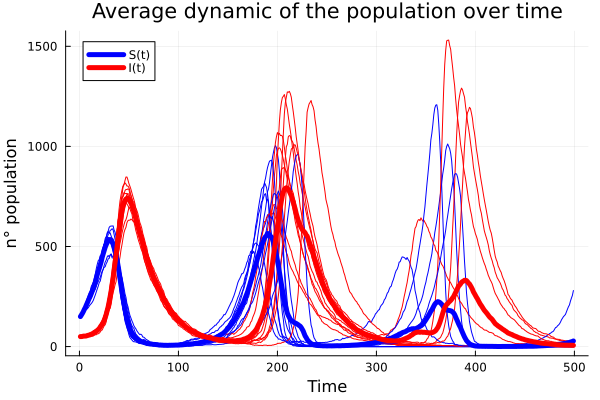

In [10]:
#Plot the average dynamic of the population over time.

I_all = []
S_all = []
R_all = []
Inew_all= []


@showprogress for m in 1:M
    res = Lodka_num_plot(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
    push!(I_all, res.nI)
    push!(S_all, res.nS)
    push!(R_all, res.nR)
       if m == 1
        plot1 = plot(res.nS, color=:blue, label="")
    else
        plot1 = plot!(res.nS, color=:blue, label="")
    end
    plot1 = plot!(res.nI, color=:red, label="")
    
end
plot1 = plot!(mean(S_all), color=:blue, linewidth=5.0, label="S(t)")
plot1 = plot!(mean(I_all), color=:red, linewidth=5.0, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

#### Dynamic over time of the algorithm
Scatter plot and evolution over time

Realisation 1

The simulation went well


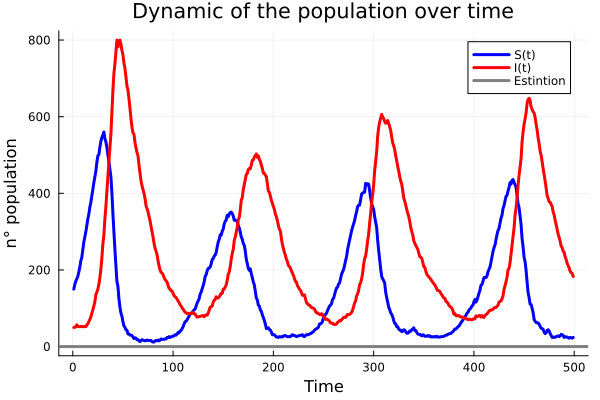

In [11]:
res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
realiz = ""
if res.time >= max_time
    realiz = "The simulation went well"
    println(realiz)
else
    realiz = "One of the population extinguished or there is divergence"
    println(realiz)
end
plot5 = plot(res.nS, res.nI, seriestype=:scatter,label="Realiation")
plot5 = vline!([0],label="Estintion", lw=3, color=:red) 
plot5 = hline!([0],label="Estintion", lw=3, color=:red)
plot5 = title!("Dynamic of the population")
plot5 = xlabel!("n° prey")
plot5 = ylabel!("n° predator")
plot6 = plot(res.nS, color=:blue, linewidth=3.0, label="S(t)")
plot6 = plot!(res.nI, color=:red, linewidth=3.0, label="I(t)")
plot6 = hline!([0],label="Estintion", lw=3, color=:grey)
plot6 = title!("Dynamic of the population over time")
plot6 = xlabel!("Time")
plot6 = ylabel!("n° population")
plot(plot6, legend=true)

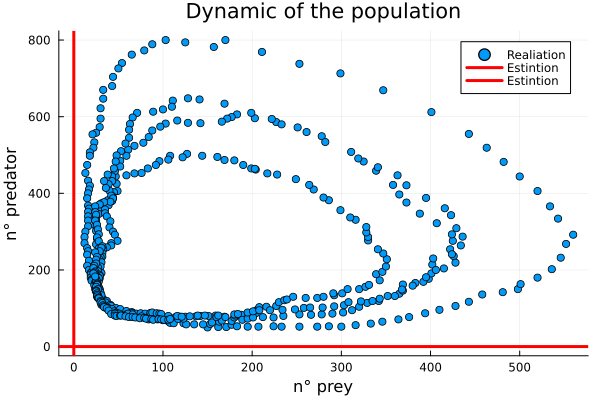

In [12]:
plot(plot5, legend=true)

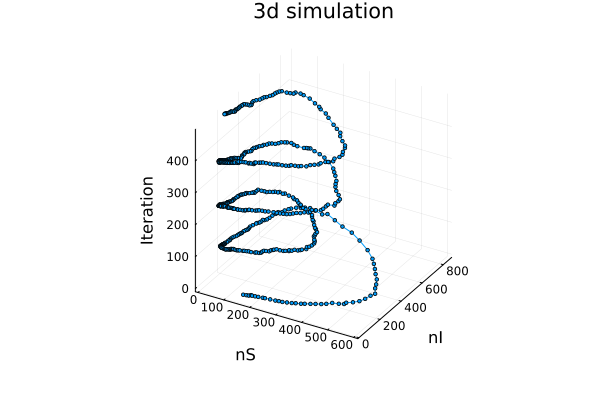

In [13]:
plt = nothing
plt = plot3d(res.nS, res.nI, 1:length(res.nI),
    xlim = (-10, maximum(res.nS)*1.1),
    ylim = (-10, maximum(res.nI)*1.1),
    zlim = (-10, length(res.nS)),
    title = "3d simulation",
    xlabel = "nS",
    ylabel = "nI",
    zlabel = "Iteration",
    legend = false,
    marker = 2,

)

Realisation 2

In [14]:
plot5 = nothing
plot6 = nothing

In [1]:
res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
realiz = ""
if res.time >= max_time
    realiz = "The simulation went well"
    println(realiz)
else
    realiz = "One of the population extinguished or there is divergence"
    println(realiz)
end
plot5 = plot(res.nS, res.nI, seriestype=:scatter,label="Realiation")
plot5 = vline!([0],label="Extintion", lw=3, color=:red) 
plot5 = hline!([0],label="Extintion", lw=3, color=:red)
plot5 = title!("Dynamic of the population")
plot5 = xlabel!("n° prey")
plot5 = ylabel!("n° predator")
plot6 = plot(res.nS, color=:blue, linewidth=3.0, label="S(t)")
plot6 = plot!(res.nI, color=:red, linewidth=3.0, label="I(t)")
plot6 = hline!([0],label="Extintion", lw=3, color=:grey)
plot6 = title!("Dynamic of the population over time")
plot6 = xlabel!("Time")
plot6 = ylabel!("n° population")
plot(plot6, legend=true)

LoadError: UndefVarError: `Lodka_num_parameter` not defined

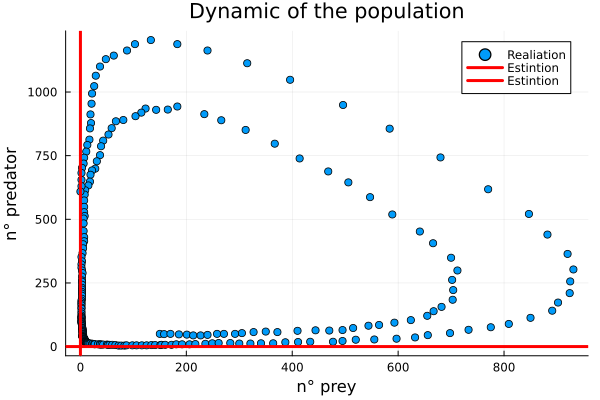

In [16]:
plot(plot5, legend=true)

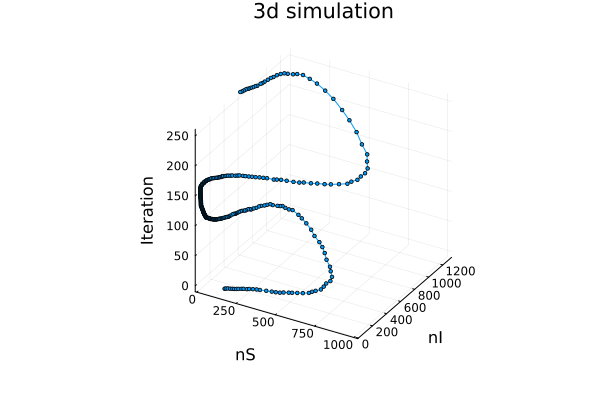

In [17]:
plt = nothing
plt = plot3d(res.nS, res.nI, 1:length(res.nI),
    xlim = (-10, maximum(res.nS)*1.1),
    ylim = (-10, maximum(res.nI)*1.1),
    zlim = (-10, length(res.nS)),
    title = "3d simulation",
    xlabel = "nS",
    ylabel = "nI",
    zlabel = "Iteration",
    legend = false,
    marker = 2,

)

Realisation 3

In [18]:
plot5 = nothing
plot6 = nothing

One of the population extinguished or there is divergence


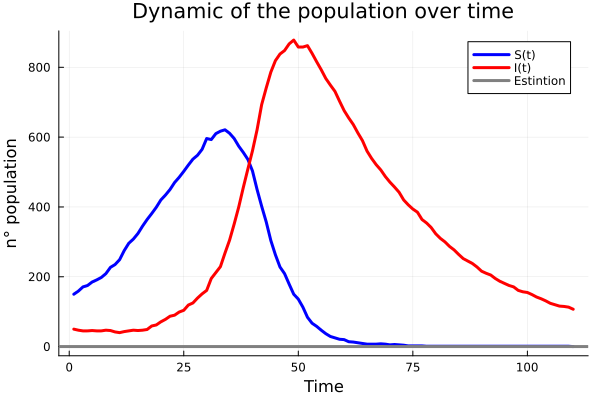

In [19]:
res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
realiz = ""
if res.time >= max_time
    realiz = "The simulation went well"
    println(realiz)
else
    realiz = "One of the population extinguished or there is divergence"
    println(realiz)
end
plot5 = plot(res.nS, res.nI, seriestype=:scatter,label="Realiation")
plot5 = vline!([0],label="Extintion", lw=3, color=:red) 
plot5 = hline!([0],label="Extintion", lw=3, color=:red)
plot5 = title!("Dynamic of the population")
plot5 = xlabel!("n° prey")
plot5 = ylabel!("n° predator")
plot6 = plot(res.nS, color=:blue, linewidth=3.0, label="S(t)")
plot6 = plot!(res.nI, color=:red, linewidth=3.0, label="I(t)")
plot6 = hline!([0],label="Extintion", lw=3, color=:grey)
plot6 = title!("Dynamic of the population over time")
plot6 = xlabel!("Time")
plot6 = ylabel!("n° population")
plot(plot6, legend=true)

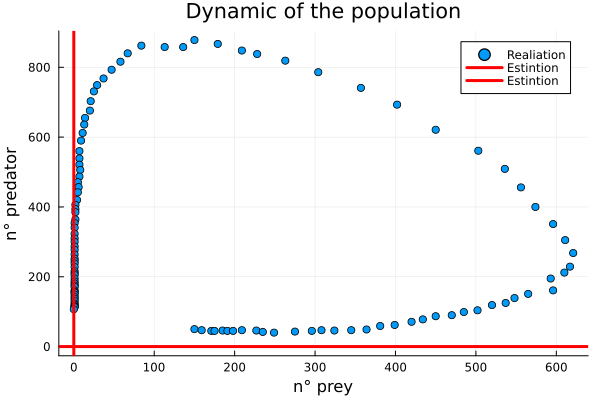

In [20]:
plot(plot5, legend=true)

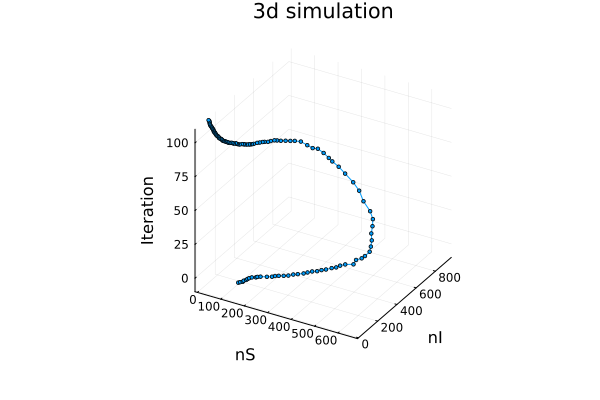

In [21]:
plt = nothing
plt = plot3d(res.nS, res.nI, 1:length(res.nI),
    xlim = (-10, maximum(res.nS)*1.1),
    ylim = (-10, maximum(res.nI)*1.1),
    zlim = (-10, length(res.nS)),
    title = "3d simulation",
    xlabel = "nS",
    ylabel = "nI",
    zlabel = "Iteration",
    legend = false,
    marker = 2,

)

Realisation 4

In [22]:
plot5 = nothing
plot6 = nothing

The simulation went well


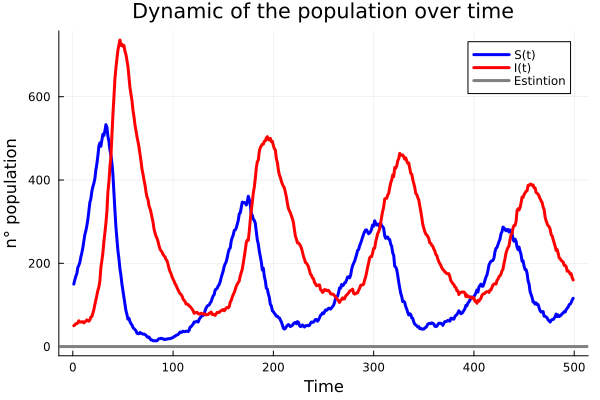

In [23]:
res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
realiz = ""
if res.time >= max_time
    realiz = "The simulation went well"
    println(realiz)
else
    realiz = "One of the population extinguished or there is divergence"
    println(realiz)
end
plot5 = plot(res.nS, res.nI, seriestype=:scatter,label="Realiation")
plot5 = vline!([0],label="Extintion", lw=3, color=:red) 
plot5 = hline!([0],label="Extintion", lw=3, color=:red)
plot5 = title!("Dynamic of the population")
plot5 = xlabel!("n° prey")
plot5 = ylabel!("n° predator")
plot6 = plot(res.nS, color=:blue, linewidth=3.0, label="S(t)")
plot6 = plot!(res.nI, color=:red, linewidth=3.0, label="I(t)")
plot6 = hline!([0],label="Extintion", lw=3, color=:grey)
plot6 = title!("Dynamic of the population over time")
plot6 = xlabel!("Time")
plot6 = ylabel!("n° population")
plot(plot6, legend=true)

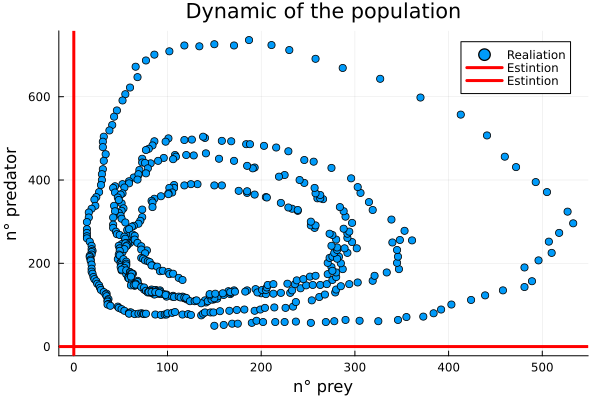

In [24]:
plot(plot5, legend=true)

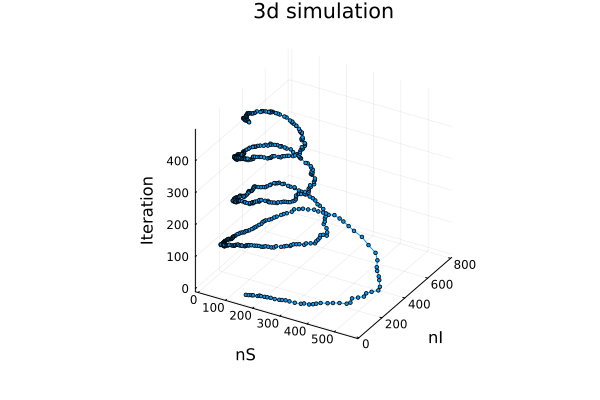

In [25]:
plt = nothing
plt = plot3d(res.nS, res.nI, 1:length(res.nI),
    xlim = (-10, maximum(res.nS)*1.1),
    ylim = (-10, maximum(res.nI)*1.1),
    zlim = (-10, length(res.nS)),
    title = "3d simulation",
    xlabel = "nS",
    ylabel = "nI",
    zlabel = "Iteration",
    legend = false,
    marker = 2,

)

Realisation 5

In [26]:
plot5 = nothing
plot6 = nothing

The simulation went well


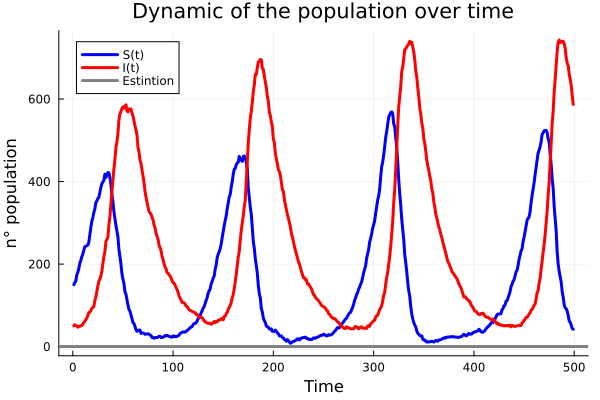

In [27]:
res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
realiz = ""
if res.time >= max_time
    realiz = "The simulation went well"
    println(realiz)
else
    realiz = "One of the population extinguished or there is divergence"
    println(realiz)
end
plot5 = plot(res.nS, res.nI, seriestype=:scatter,label="Realiation")
plot5 = vline!([0],label="Extintion", lw=3, color=:red) 
plot5 = hline!([0],label="Extintion", lw=3, color=:red)
plot5 = title!("Dynamic of the population")
plot5 = xlabel!("n° prey")
plot5 = ylabel!("n° predator")
plot6 = plot(res.nS, color=:blue, linewidth=3.0, label="S(t)")
plot6 = plot!(res.nI, color=:red, linewidth=3.0, label="I(t)")
plot6 = hline!([0],label="Extintion", lw=3, color=:grey)
plot6 = title!("Dynamic of the population over time")
plot6 = xlabel!("Time")
plot6 = ylabel!("n° population")
plot(plot6, legend=true)

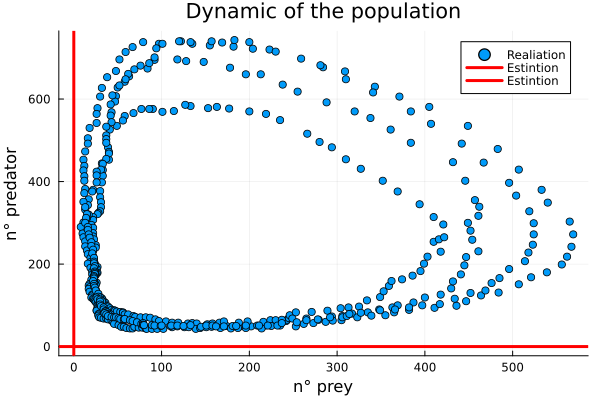

In [28]:
plot(plot5, legend=true)

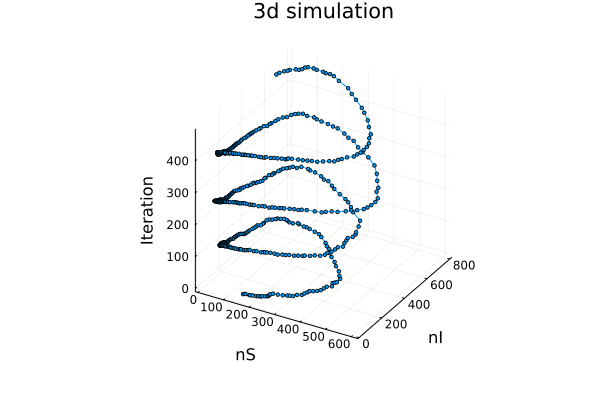

In [29]:
plt = nothing
plt = plot3d(res.nS, res.nI, 1:length(res.nI),
    xlim = (-10, maximum(res.nS)*1.1),
    ylim = (-10, maximum(res.nI)*1.1),
    zlim = (-10, length(res.nS)),
    title = "3d simulation",
    xlabel = "nS",
    ylabel = "nI",
    zlabel = "Iteration",
    legend = false,
    marker = 2,

)

# Point 2: OBSERVATION
In this regime, simulate a stationary dynamics and collect observations of
the number of new prey and new predators over a time interval $∆T$ with
a probability of observation $p_{obs} = 0.3$

We define two observation functions, Lodka_gen_and_obs_iniziale_ml! and Lodka_gen_and_obs_ml. The first one is used only for the first trial.

Lodka_gen_and_obs_iniziale_ml! generates a population sample already assuming the Lotka-Volterra model, but this means there cannot be divergence or extintion of one of the population in the time interval that we have fixed.

Afterwards we use Lodka_gen_and_obs_ml! to get general samples, with no assumptions. this function will be useful in Point 3 since we want to simulate for the same amount of trials even if most the time the simulation diverges or converges to the origins due to the extintion of at least one population.

In [30]:
#Define a personalized structure that will be used in the fuction to collect the observations. 

struct Sim{T}
    nS::Vector{T}
    nI::Vector{T}
    nR::Vector{T}
    newI::Vector{T}
    newS::Vector{T}
    obs_infS::Vector{T}
    obs_infI::Vector{T}

    function Sim(T::Int)
        return new{Int}(zeros(Int, T), zeros(Int, T),zeros(Int, T), zeros(Int, T), zeros(Int, T), zeros(Int, T),zeros(Int, T))
    end
end

In [31]:
#Define a function to collect the observations. 

function Lodka_gen_and_obs_ml!(res::Sim, N::Int, λ_interaction::Float64, λ_breed::Float64, λ_death::Float64, max_time::Int, pz::Int, p_obs::Float64, d_start::Int)

    S = N - pz
    I = pz
    R = 0
    newI = 0

    t = 2

    nS = [S]
    nI = [I]
    nR = [R]
    Inew = [0]

    fill!(res.obs_infS, 0)
    fill!(res.obs_infI, 0)


    while (t < max_time && S < 20000 && I < 20000)
        t +=1
        newI = 0 #save preys hunted but change their state only later (predators from the day after)
        newR = 0
        newS = 0
       

        prob = (1 -((1-λ_interaction)^(I)))
        newI=rand(Binomial(S,prob))
        newR=rand(Binomial(I,λ_death))
        newS=rand(Binomial(S,λ_breed))
                

        # update the state of the new preys
        # update the state of the new predators
        # update the state of the number of deads
        S += newS
        S -= newI
        I += newI
        I -= newR
        R += newR
        
        # @show t
        # @show nS
        # @show nI
        # @show nR

        if t > d_start
            res.obs_infS[t]= rand(Binomial(newS,p_obs))
            res.obs_infI[t]= rand(Binomial(newI,p_obs))
        end

        res.nS[t] = S
        res.nI[t] = I
        res.nR[t] = R
        res.newI[t] = newI
        res.newS[t] = newS       
    
    end


end


Lodka_gen_and_obs_ml! (generic function with 1 method)

In [32]:
#Define a modified version of the previous function that allows to check if one population diverges and in that case repeats the simulation.  

function Lodka_gen_and_obs_iniziale_ml!(res::Sim, N::Int, λ_interaction::Float64, λ_breed::Float64, λ_death::Float64, max_time::Int, pz::Int, p_obs::Float64, d_start::Int) #never diverges

    S = N - pz
    I = pz
    R = 0
    newI = 0

    diverg = 0
    div = true

    t = 2

    nS = [S]
    nI = [I]
    nR = [R]
    Inew = [0]

    fill!(res.obs_infS, 0)
    fill!(res.obs_infI, 0)


    while div
        S = N - pz
        I = pz
        R = 0
        newI = 0

        t = 2
        nS = []
        nI = []
        nR = []
        Inew = []
    
        div = false
        while (t < max_time && S > 0 && I > 0 && S < 200000 && I < 200000)
            t +=1
            newI = 0 #save preys hunted but change their state only later (predators from the day after)
            newR = 0
            newS = 0
            


            prob = (1 -((1-λ_interaction)^I))
            newI=rand(Binomial(S,prob))
            newR=rand(Binomial(I,λ_death))
            newS=rand(Binomial(S,λ_breed))

            # update the state of the new preys
            # update the state of the new predators
            # update the state of the number of deads
            S += newS
            S -= newI
            I += newI
            I -= newR
            R += newR
            
            # @show t
            # @show nS
            # @show nI
            # @show nR

            if t > d_start
                res.obs_infS[t]= rand(Binomial(newS,p_obs))
                res.obs_infI[t]= rand(Binomial(newI,p_obs))
            end
    
            res.nS[t] = S
            res.nI[t] = I
            res.nR[t] = R
            res.newI[t] = newI
            res.newS[t] = newS     
        
        
    
        end
        if t < max_time
            @show "One of the population diverges please run the code again"
            div += 1
            div = true
        end
    end


end

Lodka_gen_and_obs_iniziale_ml! (generic function with 1 method)

Since we have assumed that we are collecting from Lodka-Volterra there is no extintion, therefore we use Lodka_gen_and_obs_iniziale_ml!

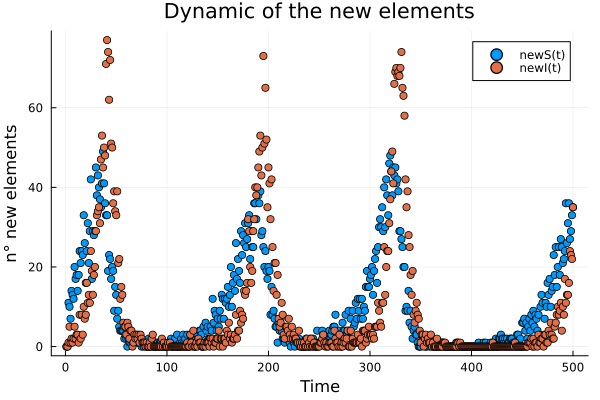

In [33]:
#Define an observation of Lodka-Volterra model and plot the results. 

res = Sim(max_time)

p_obs = 0.3
d_start = 1
Lodka_gen_and_obs_iniziale_ml!(res, N, λ_interaction, λ_breed, λ_death, max_time, pz, p_obs, d_start);
ObsS = res.obs_infS
ObsI = res.obs_infI

plot2 = plot(res.newI, label="newI(t)", linewidth=3.0)
plot2 = scatter!(ObsI, label="ObsI(t)", linewidth=2.0)
plot2 = title!("Dynamic of the predators over time")
plot2 = xlabel!("Time")
plot2 = ylabel!("Predators")

plot3 = plot(res.newS, label="newS(t)", linewidth=3.0)
plot3 = scatter!(ObsS, label="ObsS(t)", linewidth=2.0)
plot3 = title!("Dynamic of the prey over time")
plot3 = xlabel!("Time")
plot3 = ylabel!("Prey")

plot4 = plot(res.nS, label="S(t)", linewidth=3.0)
plot4 = plot!(res.nI, label="I(t)", linewidth=3.0)
plot4 = title!("Dynamic of the population over time")
plot4 = xlabel!("Time")
plot4 = ylabel!("n° population")

plot5 = plot(ObsS, label="Obs_newS(t)", linewidth=3.0)
plot5 = plot!(ObsI, label="Obs_newI(t)", linewidth=3.0)
plot5 = title!("Dynamic of the new elements Observed ")
plot5 = xlabel!("Time")
plot5 = ylabel!("n° observation")

plot6 = plot(res.newS, seriestype=:scatter, label="newS(t)", linewidth=3.0)
plot6 = plot!(res.newI, seriestype=:scatter, label="newI(t)", linewidth=3.0)
plot6 = title!("Dynamic of the new elements")
plot6 = xlabel!("Time")
plot6 = ylabel!("n° new elements")

# groud-truth

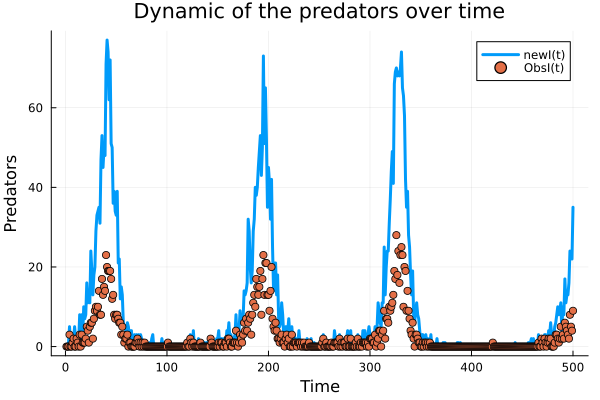

In [34]:
plot(plot2)

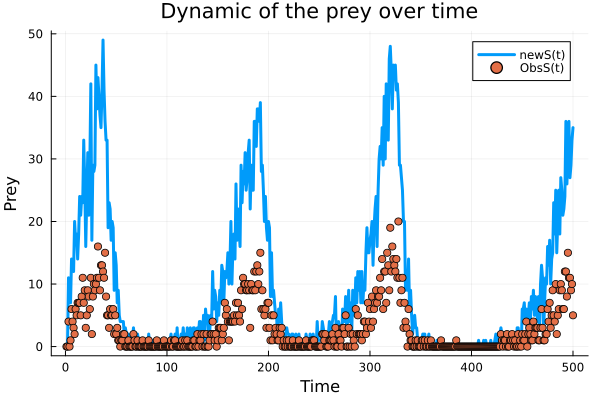

In [35]:
plot(plot3)

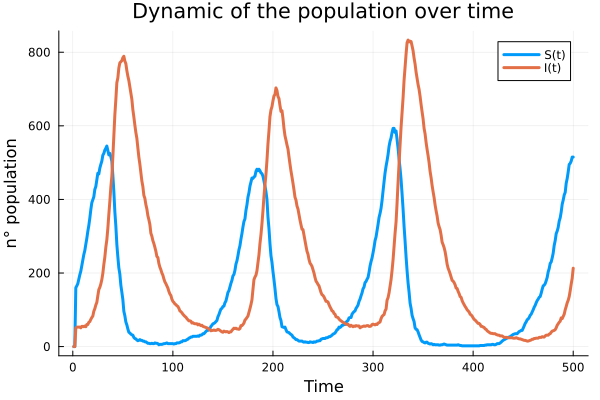

In [36]:
plot(plot4)

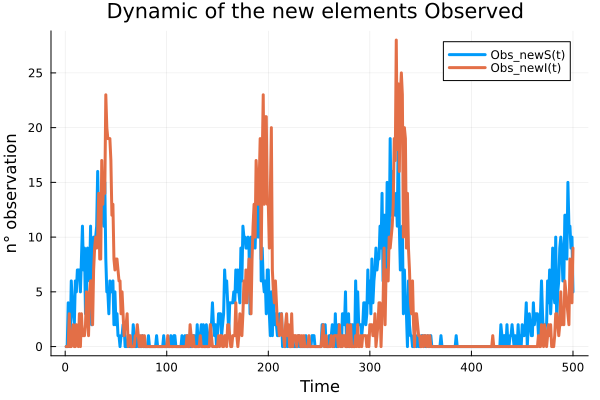

In [37]:
plot(plot5)

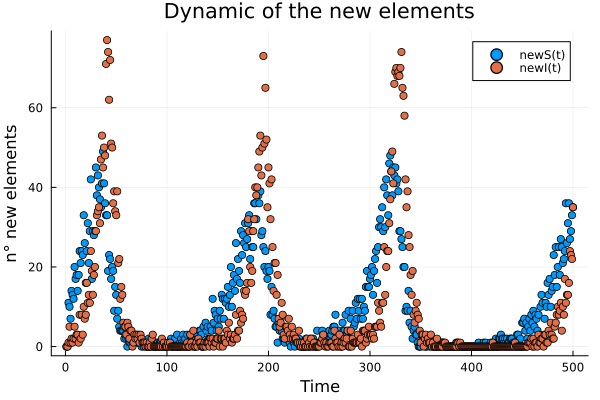

In [38]:
plot(plot6)

# Point 3 : ABCMC for two parameter
Design an Approximate Bayesian Computation Monte Carlo (ABCMC)
method to learn two of the three probabilities, while setting the third one
equal to the true one.

In [39]:
#Define a distance

function dist(a,b) 
    return sum(abs.(a-b)) 
end

dist (generic function with 1 method)

In [40]:
#Define a function that collects a sample and checks if the distance between the generated and observed data is less than a prespecified error. 

function gen_samples_ml!(res, numiter, ObsI0, ObsS0, N, pz, λ_interaction, λ_breed, λ_death, ϵI, ϵS, p_obs, d_start, max_time)
    count = 0
    dist_nowS = 0.0
    dist_nowI = 0.0
    for iter = 1:numiter
        Lodka_gen_and_obs_ml!(res, N, λ_interaction, λ_breed, λ_death, max_time, pz, p_obs, d_start); 
        ObsI1 = res.obs_infI
        ObsS1 = res.obs_infS
        dist_nowS += dist(ObsS1, ObsS0)
        if dist(ObsI1, ObsI0) <= ϵI && dist(ObsS1, ObsS0) <= ϵS
            count += 1
        end
    end
    return count, dist_nowS/numiter , dist_nowI/numiter 
end

gen_samples_ml! (generic function with 1 method)

In [41]:
#Parameters
num_trial_parameter = 30000
num_repetition = 150
res_inf = Sim(max_time)
Restriction = 3
error_initial = 0.9 #initial error
α = 0.6 #decrease factor of num_trial
β = 0.8 #decrease factor of num_repetition_per_pair

error_I = [error_initial]
error_S = [error_initial]

for k in 2:Restriction
    append!(error_I,error_I[k-1]*0.92)
    append!(error_S,error_S[k-1]*0.92)
end
@show error_I
@show error_S
@show sum(ObsI)
@show sum(ObsS)

error_I = [0.9, 0.8280000000000001, 0.7617600000000001]
error_S = [0.9, 0.8280000000000001, 0.7617600000000001]
sum(ObsI) = 1373
sum(ObsS) = 1502


1502

## Estimation of the parameter
After defining a distance function between observations, we set an acceptance level $\epsilon$ and repeat the process 

1. sample $\theta^*$ with the function gen_samples_ml! ;
2. simulate a set of data $D^*$ from the model using parameters $\theta^*$;
3. accept $\theta^*$ if $d(D^*,D_{\rm true})<\epsilon$, otherwise reject.

Then we plot an histogram of the found values and we compare it with the true value.

In our algorithm we implement a ABCMC method updating the information as many times as the restrictions. For each restriction we 

1. reduce the acceptance area 
2. update the knowledge of the prior distribution with the information from the previous simulation rescaling the interval of the uniform distribution with an internal error of 10%
3. reducing the number of trials

We fix an internal error of 10% because in the case that only one parameter generates a "good" simulation, then in the next repetition the algorithm explores better the neighbour of that point. If also it continues to be the "Best" parameter in the following iteration, it could be the best approximation of the real value with our model. Meanwhile, collecting information, we could shrink the acceptance area.

We decide to set a higher num_repetition_per_pair due to the huge oscillation of our algorithm. For this reason we want to be "as much sure as we can" that when the prior distribution samples a "good" parameter then the simulated process enters in the acceptance region $d(D^*,D_{\rm true})<\epsilon$.

For each setp the functions print the mean and the standard deviation of the simulation and the min-max of the parameter that is found.

#### λ_interaction True

In [42]:
# 
num_trial = deepcopy(num_trial_parameter)
num_repetition_per_pair = deepcopy(num_repetition)
res_inf = Sim(max_time)

λ_breed_min = 0.0
λ_breed_max = 1.0
λ_death_min = 0.0
λ_death_max = 1.0

solution_found = false
all_λ_breed = [0.0]
all_λ_death = [0.0]

all_λ_breed_ip_in = 0
all_λ_death_ip_in = 0
all_λ_breed_ip_fin = 0
all_λ_death_ip_fin = 0
        

@showprogress for k in 1:Restriction
    @show k
    solution_found = false

    all_λ_breed_ip_in = length(all_λ_breed)
    all_λ_death_ip_in = length(all_λ_death)

    ϵI = sum(ObsI)*error_I[k] # acceptance I
    ϵS = sum(ObsS)*error_S[k] # acceptance S
    
    while !solution_found
        for i in 1:num_trial
            m = λ_death_min + (λ_death_max - λ_death_min) * rand()
            b  = λ_breed_min + (λ_breed_max - λ_breed_min) * rand()
            num_success, _ = gen_samples_ml!(res_inf, num_repetition_per_pair, ObsI, ObsS, N, pz, λ_interaction, b , m, ϵI, ϵS, p_obs, d_start, max_time)
            for c in 1:num_success
                append!(all_λ_death, m)
                append!(all_λ_breed, b)
            end
        end

        all_λ_breed_ip_fin = length(all_λ_breed)
        all_λ_death_ip_fin = length(all_λ_death)
        
        if all_λ_breed_ip_fin != all_λ_breed_ip_in
            solution_found = true
            @show error_S[k]
            num_trial = num_trial * α
            num_repetition_per_pair = num_repetition_per_pair * β
            λ_breed_min = max(minimum(all_λ_breed[all_λ_breed_ip_in:all_λ_breed_ip_fin])*0.9,0)
            λ_breed_max = min(maximum(all_λ_breed[all_λ_breed_ip_in:all_λ_breed_ip_fin])*1.1,1)
            λ_death_min = max(minimum(all_λ_death[all_λ_death_ip_in:all_λ_death_ip_fin])*0.9,0)
            λ_death_max = min(maximum(all_λ_death[all_λ_death_ip_in:all_λ_death_ip_fin])*1.1,1)
        end
        @show all_λ_death_ip_fin
    end
    

    println("λ_breed_min = ", λ_breed_min)
    println("λ_breed_max = ", λ_breed_max)
    println("λ_death_min = ", λ_death_min)
    println("λ_death_max = ", λ_death_max)

    println("λ_breed Mean and standar deviation = ", mean(all_λ_breed[all_λ_breed_ip_in:all_λ_breed_ip_fin]), " ±  ", std(all_λ_breed[all_λ_breed_ip_in:all_λ_breed_ip_fin]))
    println("λ_death Mean and standar deviation = ", mean(all_λ_death[all_λ_death_ip_in:all_λ_death_ip_fin]), " ± ", std(all_λ_death[all_λ_death_ip_in:all_λ_death_ip_fin]))  
    

    println("Solution found= ", all_λ_breed_ip_fin)
    println(" -------------------------------- ")

end

k = 1
error_S[k] = 0.9
all_λ_death_ip_fin = 2851
λ_breed_min = 0.0
λ_breed_max = 0.11053845701943471
λ_death_min = 0.0
λ_death_max = 0.08483515801523195
λ_breed Mean and standar deviation = 0.0667965914952728 ±  0.010861972046725486
λ_death Mean and standar deviation = 0.023211253383885435 ± 0.013069308439911845
Solution found= 2851
 -------------------------------- 
k = 2


Progress:  67%|████████████████████████████             |  ETA: 0:06:23

error_S[k] = 0.8280000000000001
all_λ_death_ip_fin = 20614
λ_breed_min = 0.027413342751780145
λ_breed_max = 0.1211566745912325
λ_death_min = 0.01003258841810536
λ_death_max = 0.09078778244217094
λ_breed Mean and standar deviation = 0.06639348998550688 ±  0.011462272296905166
λ_death Mean and standar deviation = 0.038204614873958515 ± 0.009109211250670044
Solution found= 20614
 -------------------------------- 
k = 3

Progress: 100%|█████████████████████████████████████████| Time: 0:18:19



error_S[k] = 0.7617600000000001
all_λ_death_ip_fin = 24354
λ_breed_min = 0.03358629966335717
λ_breed_max = 0.11048568190218452
λ_death_min = 0.012564660650408118
λ_death_max = 0.08076276805195597
λ_breed Mean and standar deviation = 0.06688528981848181 ±  0.009495495832465336
λ_death Mean and standar deviation = 0.03907882012061198 ± 0.007802144484241397
Solution found= 24354
 -------------------------------- 


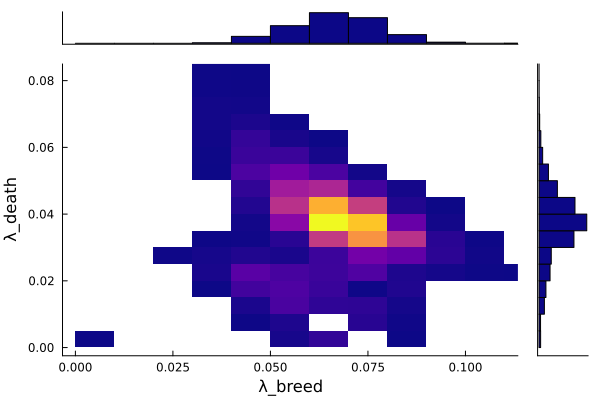

In [43]:
marginalhist(all_λ_breed, all_λ_death, bins = 20, fc = :plasma, xlabel="λ_breed", ylabel="λ_death")

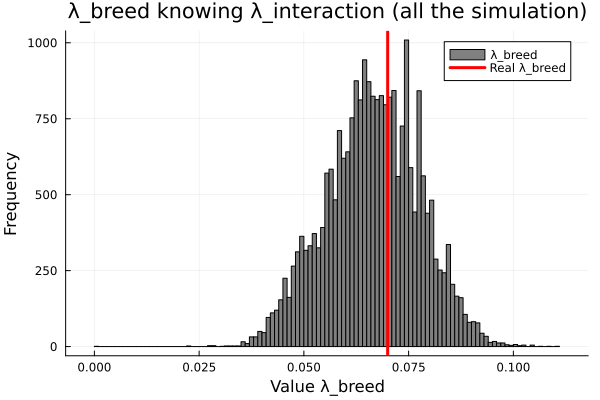

In [44]:
histogram(all_λ_breed, label="λ_breed", color=:gray)
vline!([λ_breed],label="Real λ_breed", lw=3, color=:red) # Add a vertical line
title!("λ_breed knowing λ_interaction (all the simulation)")
xlabel!("Value λ_breed")
ylabel!("Frequency")

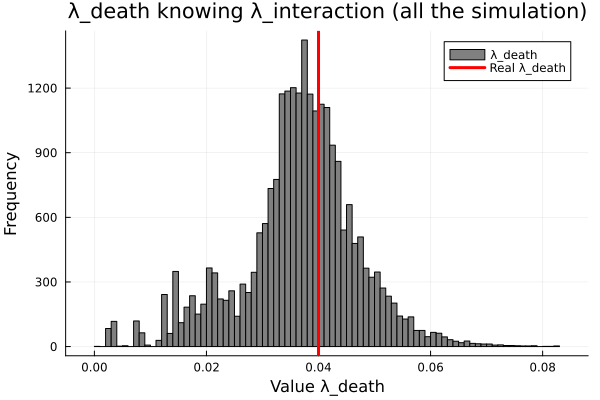

In [45]:
histogram(all_λ_death, label="λ_death", color=:gray)
vline!([λ_death],label="Real λ_death", lw=3, color=:red) # Add a vertical line
title!("λ_death knowing λ_interaction (all the simulation)")
xlabel!("Value λ_death")
ylabel!("Frequency")

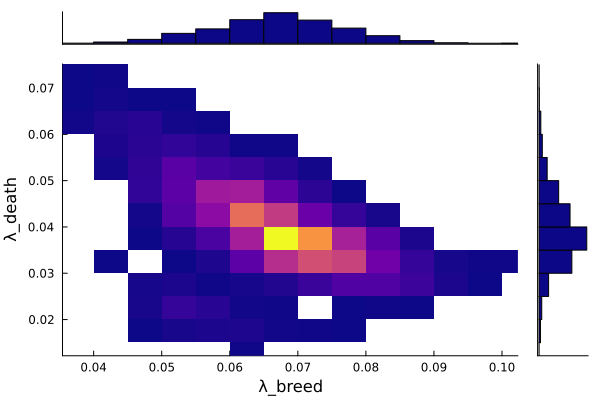

In [46]:
marginalhist(all_λ_breed[all_λ_breed_ip_in:all_λ_breed_ip_fin], all_λ_death[all_λ_death_ip_in:all_λ_death_ip_fin], bins = 20, fc = :plasma, xlabel="λ_breed", ylabel="λ_death")

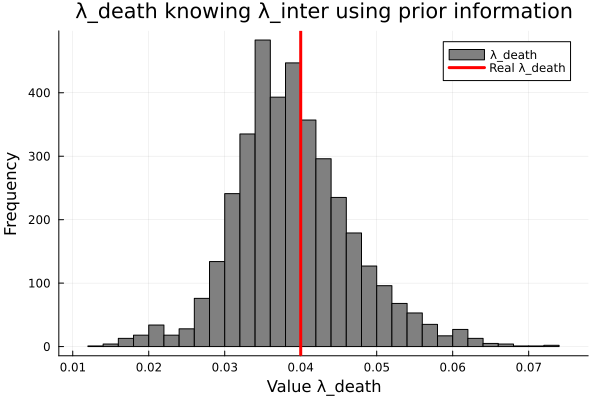

In [47]:
histogram(all_λ_death[all_λ_death_ip_in:all_λ_death_ip_fin], label="λ_death", color=:gray)
vline!([λ_death],label="Real λ_death", lw=3, color=:red) # Add a vertical line
title!("λ_death knowing λ_inter using prior information")
xlabel!("Value λ_death")
ylabel!("Frequency")

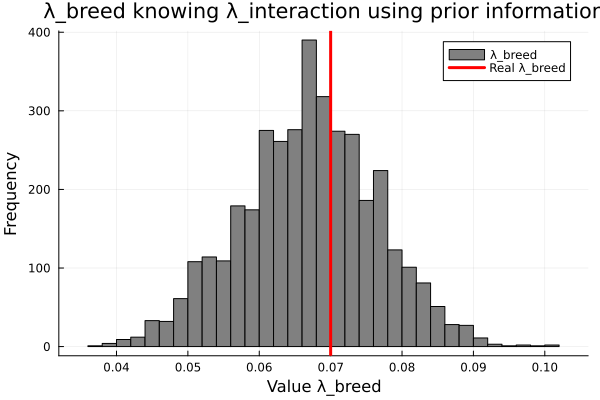

In [48]:
histogram(all_λ_breed[all_λ_breed_ip_in:all_λ_breed_ip_fin], label="λ_breed", color=:gray)
vline!([λ_breed],label="Real λ_breed", lw=3, color=:red) # Add a vertical line
title!("λ_breed knowing λ_interaction using prior information")
xlabel!("Value λ_breed")
ylabel!("Frequency")

#### λ_breed True

In [49]:
# 
num_trial = deepcopy(num_trial_parameter)
num_repetition_per_pair = deepcopy(num_repetition)
res_inf = Sim(max_time)

λ_interaction_min = 0.0
λ_interaction_max = 1.0
λ_death_min = 0.0
λ_death_max = 1.0

solution_found = false
all_λ_interaction_2  = [0.0]
all_λ_death_2 = [0.0]

all_λ_interaction_ip_in = 0
all_λ_death_ip_in = 0
all_λ_interaction_ip_fin = 0
all_λ_death_ip_fin = 0
        

@showprogress for k in 1:Restriction
    @show k
    solution_found = false

    all_λ_interaction_ip_in = length(all_λ_interaction_2)
    all_λ_death_ip_in = length(all_λ_death_2)

    ϵI = sum(ObsI)*error_I[k] # acceptance I
    ϵS = sum(ObsS)*error_S[k] # acceptance S
    
    while !solution_found
        for i in 1:num_trial
            m = λ_death_min + (λ_death_max - λ_death_min) * rand()
            l  = λ_interaction_min + (λ_interaction_max - λ_interaction_min) * rand()
            num_success, _ = gen_samples_ml!(res_inf, num_repetition_per_pair, ObsI, ObsS, N, pz, l, λ_breed , m, ϵI, ϵS, p_obs, d_start, max_time)
            for c in 1:num_success
                append!(all_λ_death_2, m)
                append!(all_λ_interaction_2, l)
            end
        end

        all_λ_interaction_ip_fin = length(all_λ_interaction_2)
        all_λ_death_ip_fin = length(all_λ_death_2)
        
        if all_λ_interaction_ip_fin != all_λ_interaction_ip_in
            solution_found = true
            @show error_S[k]
            num_trial = num_trial * α
            num_repetition_per_pair = num_repetition_per_pair * β
            λ_interaction_min = max(minimum(all_λ_interaction_2[all_λ_interaction_ip_in:all_λ_interaction_ip_fin])*0.9,0)
            λ_interaction_max = min(maximum(all_λ_interaction_2[all_λ_interaction_ip_in:all_λ_interaction_ip_fin])*1.1,1)
            λ_death_min = max(minimum(all_λ_death_2[all_λ_death_ip_in:all_λ_death_ip_fin])*0.9,0)
            λ_death_max = min(maximum(all_λ_death_2[all_λ_death_ip_in:all_λ_death_ip_fin])*1.1,1)
        end
        @show all_λ_death_ip_fin
    end
    


    println("λ_interaction_min = ", λ_interaction_min)
    println("λ_interaction_max = ", λ_interaction_max)
    println("λ_death_min = ", λ_death_min)
    println("λ_death_max = ", λ_death_max)

    println("λ_interaction Mean and standar deviation = ", mean(all_λ_interaction_2[all_λ_interaction_ip_in:all_λ_interaction_ip_fin]), " ± ", std(all_λ_interaction_2[all_λ_interaction_ip_in:all_λ_interaction_ip_fin]))
    println("λ_death Mean and standar deviation = ", mean(all_λ_death_2[all_λ_death_ip_in:all_λ_death_ip_fin]), "± ", std(all_λ_death_2[all_λ_death_ip_in:all_λ_death_ip_fin]))  
    

    println("solution_found = ", all_λ_interaction_ip_fin)
    println(" -------------------------------- ")

end

k = 1
all_λ_death_ip_fin = 1
error_S[k] = 0.9
all_λ_death_ip_fin = 3
λ_interaction_min = 0.0
λ_interaction_max = 0.0011167741622960749
λ_death_min = 0.0
λ_death_max = 0.07711545204189016
λ_interaction Mean and standar deviation = 0.0005829860412151685 ± 0.000524138136197646
λ_death Mean and standar deviation = 0.04040864721113709± 0.03625936937429679
solution_found = 3
 -------------------------------- 
k = 2


Progress:  67%|████████████████████████████             |  ETA: 0:12:36

error_S[k] = 0.8280000000000001
all_λ_death_ip_fin = 19043
λ_interaction_min = 0.00015961987278966864
λ_interaction_max = 0.0012216596279766077
λ_death_min = 0.010277110798851269
λ_death_max = 0.08287257594000137
λ_interaction Mean and standar deviation = 0.0004101719311252475 ± 0.00010268764658620857
λ_death Mean and standar deviation = 0.0370981458056111± 0.0055448638777801686
solution_found = 19043
 -------------------------------- 
k = 3

Progress: 100%|█████████████████████████████████████████| Time: 0:28:30



error_S[k] = 0.7617600000000001
all_λ_death_ip_fin = 22216
λ_interaction_min = 0.0001761467318701399
λ_interaction_max = 0.0009862007745556926
λ_death_min = 0.0123668003988684
λ_death_max = 0.06663104653019865
λ_interaction Mean and standar deviation = 0.00036999807533753484 ± 7.403453830077684e-5
λ_death Mean and standar deviation = 0.03773334524694042± 0.004748113506165305
solution_found = 22216
 -------------------------------- 


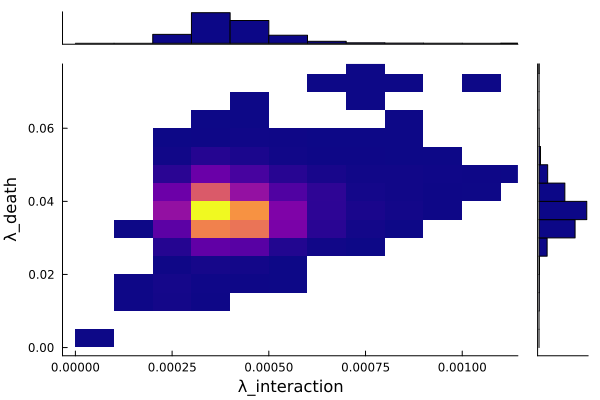

In [50]:
marginalhist(all_λ_interaction_2, all_λ_death_2, bins = 20, fc = :plasma, xlabel="λ_interaction", ylabel="λ_death")

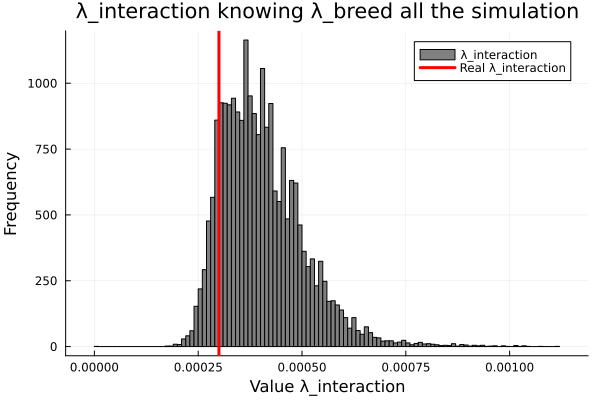

In [51]:
histogram(all_λ_interaction_2, label="λ_interaction", color=:gray)
vline!([λ_interaction],label="Real λ_interaction", lw=3, color=:red) # Add a vertical line
title!("λ_interaction knowing λ_breed all the simulation")
xlabel!("Value λ_interaction")
ylabel!("Frequency")

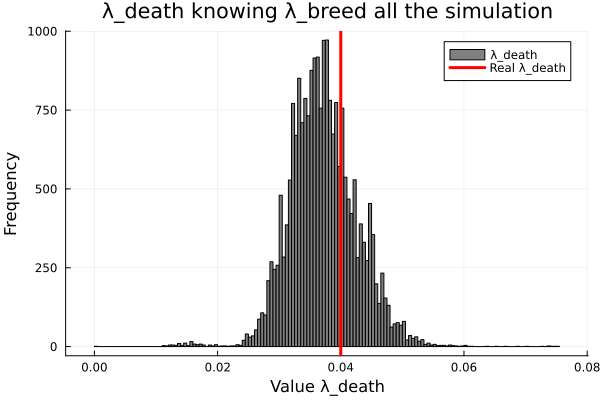

In [52]:
histogram(all_λ_death_2, label="λ_death", color=:gray)
vline!([λ_death],label="Real λ_death", lw=3, color=:red) # Add a vertical line
title!("λ_death knowing λ_breed all the simulation")
xlabel!("Value λ_death")
ylabel!("Frequency")

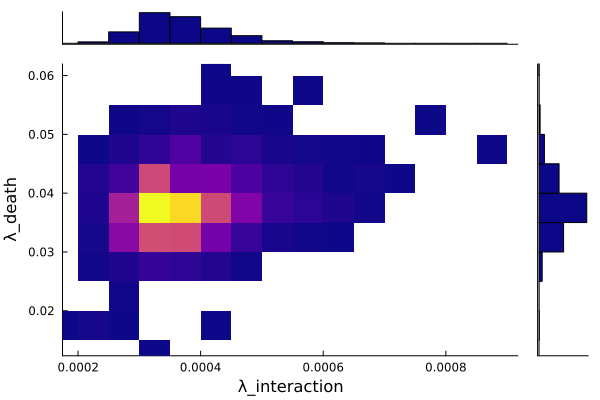

In [53]:
marginalhist(all_λ_interaction_2[all_λ_interaction_ip_in:all_λ_interaction_ip_fin], all_λ_death_2[all_λ_death_ip_in:all_λ_death_ip_fin], bins = 20, fc = :plasma, xlabel="λ_interaction", ylabel="λ_death")

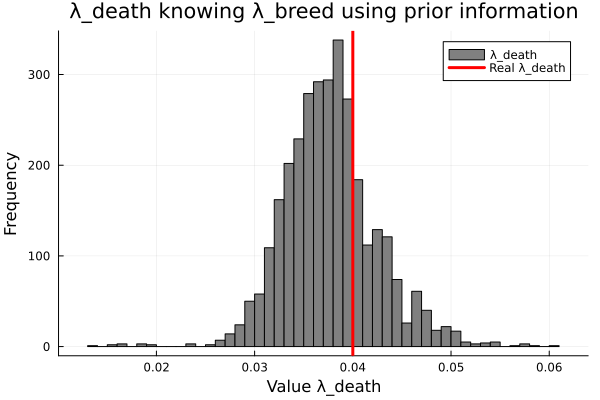

In [54]:
histogram(all_λ_death_2[all_λ_death_ip_in:all_λ_death_ip_fin], label="λ_death", color=:gray)
vline!([λ_death],label="Real λ_death", lw=3, color=:red) # Add a vertical line
title!("λ_death knowing λ_breed using prior information")
xlabel!("Value λ_death")
ylabel!("Frequency")

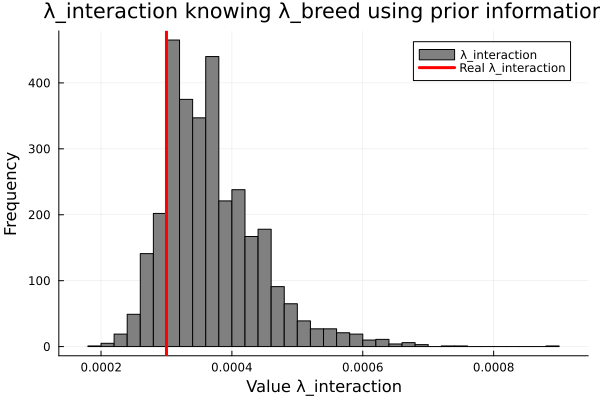

In [55]:
histogram(all_λ_interaction_2[all_λ_interaction_ip_in:all_λ_interaction_ip_fin], label="λ_interaction", color=:gray)
vline!([λ_interaction],label="Real λ_interaction", lw=3, color=:red) # Add a vertical line
title!("λ_interaction knowing λ_breed using prior information")
xlabel!("Value λ_interaction")
ylabel!("Frequency")

#### λ_death true

In [100]:
# 
num_trial = deepcopy(num_trial_parameter)
num_repetition_per_pair = deepcopy(num_repetition)
res_inf = Sim(max_time)

λ_interaction_min = 0.0
λ_interaction_max = 1.0
λ_breed_min = 0.0
λ_breed_max = 1.0

solution_found = false
all_λ_interaction_3  = [0.0]
all_λ_breed_3 = [0.0]

all_λ_interaction_ip_in = 0
all_λ_breed_ip_in = 0
all_λ_interaction_ip_fin = 0
all_λ_breed_ip_fin = 0
        

@showprogress for k in 1:Restriction
    @show k
    solution_found = false

    all_λ_interaction_ip_in = length(all_λ_interaction_3)
    all_λ_breed_ip_in = length(all_λ_breed_3)

    ϵI = sum(ObsI)*error_I[k] # acceptance I
    ϵS = sum(ObsS)*error_S[k] # acceptance S
    
    while !solution_found
        for i in 1:num_trial
            b = λ_breed_min + (λ_breed_max - λ_breed_min) * rand()
            l  = λ_interaction_min + (λ_interaction_max - λ_interaction_min) * rand()
            num_success, _ = gen_samples_ml!(res_inf, num_repetition_per_pair, ObsI, ObsS, N, pz, l, b , λ_death, ϵI, ϵS, p_obs, d_start, max_time)
            for c in 1:num_success
                append!(all_λ_breed_3, b)
                append!(all_λ_interaction_3, l)
            end
        end

        all_λ_breed_ip_fin = length(all_λ_breed_3)
        all_λ_interaction_ip_fin = length(all_λ_interaction_3)
        
        if all_λ_breed_ip_fin != all_λ_breed_ip_in
            solution_found = true
            @show error_S[k]
            num_trial = num_trial * α
            num_repetition_per_pair = num_repetition_per_pair * β
            λ_interaction_min = max(minimum(all_λ_interaction_3[all_λ_interaction_ip_in:all_λ_interaction_ip_fin])*0.9,0)
            λ_interaction_max = min(maximum(all_λ_interaction_3[all_λ_interaction_ip_in:all_λ_interaction_ip_fin])*1.1,1)
            λ_breed_min = max(minimum(all_λ_breed_3[all_λ_breed_ip_in:all_λ_breed_ip_fin])*0.9,0)
            λ_breed_max = min(maximum(all_λ_breed_3[all_λ_breed_ip_in:all_λ_breed_ip_fin])*1.1,1)
        end
        @show all_λ_breed_ip_fin
    end


    


    println("λ_interaction_min = ", λ_interaction_min)
    println("λ_interaction_max = ", λ_interaction_max)
    println("λ_breed_min = ", λ_breed_min)
    println("λ_breed_max = ", λ_breed_max)

    println("λ_interaction Mean and standar deviation = ", mean(all_λ_interaction_3[all_λ_interaction_ip_in:all_λ_interaction_ip_fin]), " ± ", std(all_λ_interaction_3[all_λ_interaction_ip_in:all_λ_interaction_ip_fin]))
    println("λ_breed Mean and standar deviation = ", mean(all_λ_breed_3[all_λ_breed_ip_in:all_λ_breed_ip_fin]), " ± ", std(all_λ_breed_3[all_λ_breed_ip_in:all_λ_breed_ip_fin]))
    

    println("solution_found = ", all_λ_breed_ip_fin)
    println(" -------------------------------- ")

end

k = 1
error_S[k] = 0.95
all_λ_breed_ip_fin = 34
λ_interaction_min = 0.0
λ_interaction_max = 0.002593074053182043
λ_breed_min = 0.0
λ_breed_max = 0.08855034530632978
λ_interaction Mean and standar deviation = 0.0007542216985505175 ± 0.0004344626785927216
λ_breed Mean and standar deviation = 0.04349777082204051 ± 0.02078113792814144
solution_found = 34
 -------------------------------- 
k = 2


Progress:  67%|████████████████████████████             |  ETA: 0:08:52

error_S[k] = 0.874
all_λ_breed_ip_fin = 11151
λ_interaction_min = 0.0001948702440491643
λ_interaction_max = 0.0016318821287688052
λ_breed_min = 0.020565784004371195
λ_breed_max = 0.09733017799243666
λ_interaction Mean and standar deviation = 0.0004999415122721053 ± 0.00016008437098071808
λ_breed Mean and standar deviation = 0.05132482444054625 ± 0.008993334353035362
solution_found = 11151
 -------------------------------- 
k = 3

Progress: 100%|█████████████████████████████████████████| Time: 0:21:37



error_S[k] = 0.80408
all_λ_breed_ip_fin = 14363
λ_interaction_min = 0.00020641188410787525
λ_interaction_max = 0.0011721127841566128
λ_breed_min = 0.030358742748413253
λ_breed_max = 0.09495188339439066
λ_interaction Mean and standar deviation = 0.0004322115422583439 ± 0.00010610253848920519
λ_breed Mean and standar deviation = 0.05455210574329051 ± 0.007869701152672732
solution_found = 14363
 -------------------------------- 


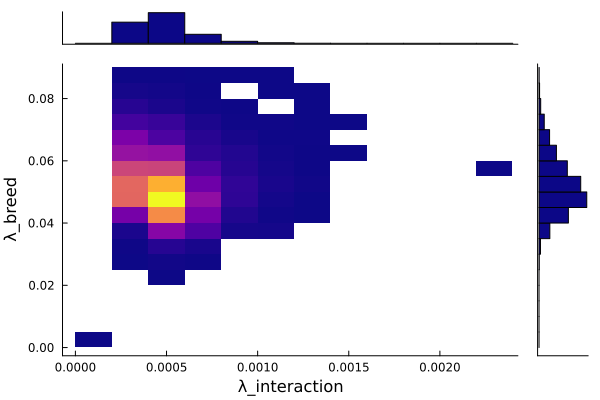

In [101]:
marginalhist(all_λ_interaction_3, all_λ_breed_3, bins = 20, fc = :plasma, xlabel="λ_interaction", ylabel="λ_breed")


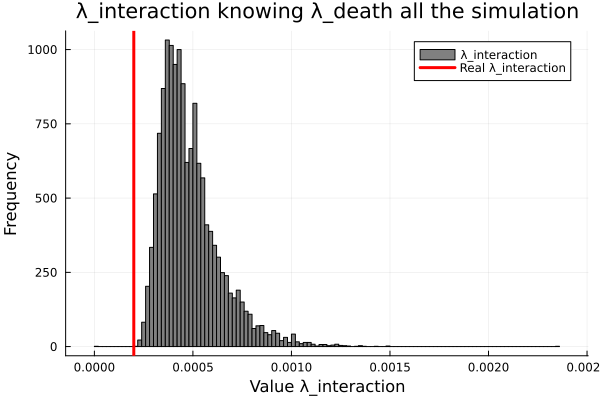

In [102]:
histogram(all_λ_interaction_3, label="λ_interaction", color=:gray)
vline!([λ_interaction],label="Real λ_interaction", lw=3, color=:red) # Add a vertical line
title!("λ_interaction knowing λ_death all the simulation")
xlabel!("Value λ_interaction")
ylabel!("Frequency")

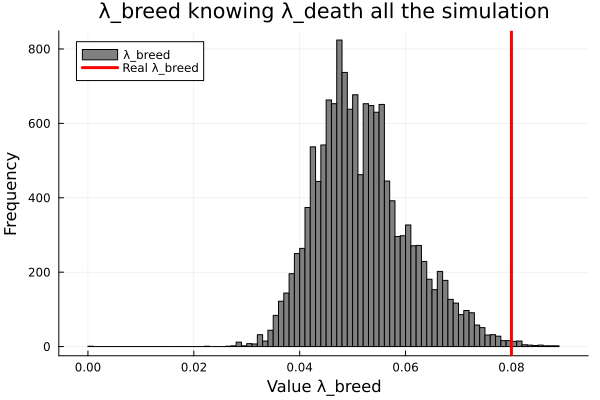

In [103]:
histogram(all_λ_breed_3, label="λ_breed", color=:gray)
vline!([λ_breed],label="Real λ_breed", lw=3, color=:red) # Add a vertical line
title!("λ_breed knowing λ_death all the simulation")
xlabel!("Value λ_breed")
ylabel!("Frequency")

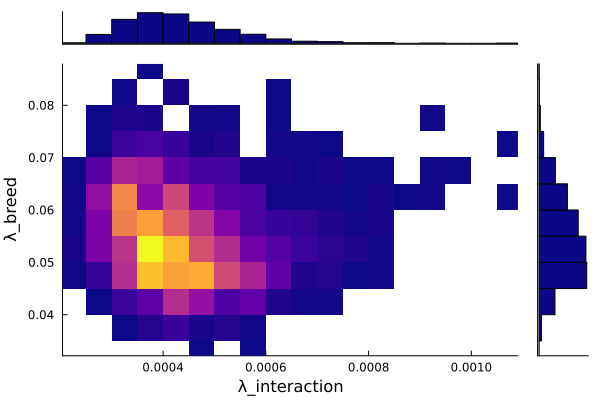

In [104]:
marginalhist(all_λ_interaction_3[all_λ_interaction_ip_in:all_λ_interaction_ip_fin], all_λ_breed_3[all_λ_breed_ip_in:all_λ_breed_ip_fin], bins = 20, fc = :plasma, xlabel="λ_interaction", ylabel="λ_breed")

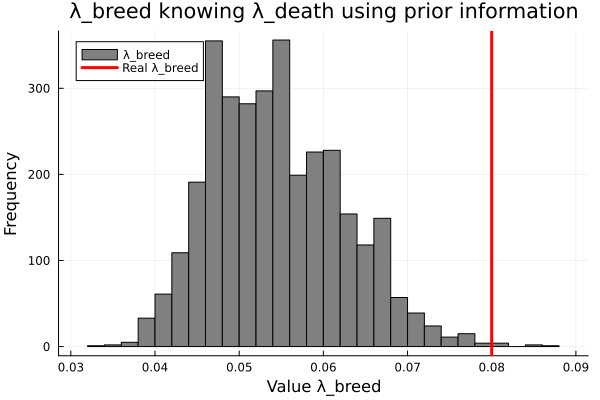

In [105]:
histogram(all_λ_breed_3[all_λ_breed_ip_in:all_λ_breed_ip_fin], label="λ_breed", color=:gray)
vline!([λ_breed],label="Real λ_breed", lw=3, color=:red) # Add a vertical line
title!("λ_breed knowing λ_death using prior information")
xlabel!("Value λ_breed")
ylabel!("Frequency")

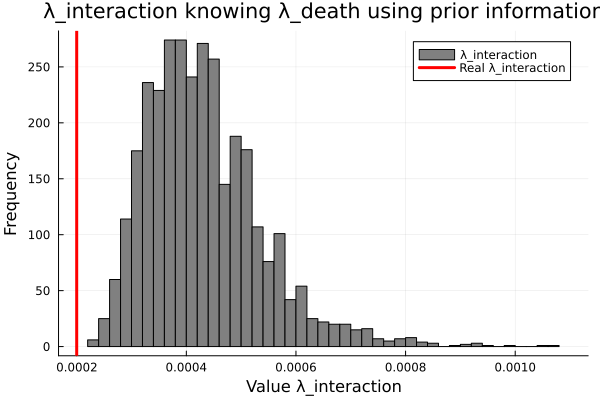

In [106]:
histogram(all_λ_interaction_3[all_λ_interaction_ip_in:all_λ_interaction_ip_fin], label="λ_interaction", color=:gray)
vline!([λ_interaction],label="Real λ_interaction", lw=3, color=:red) # Add a vertical line
title!("λ_interaction knowing λ_death using prior information")
xlabel!("Value λ_interaction")
ylabel!("Frequency")

# Point 4 : ABCMC for three parameter

We follow the same path as before, but with one more dimention. For this reason we need many more iterations (num_trial); since the state space is much wider it is more difficult to find acceptable values for the parameters. Also num_repetition_per_pair is high; the model oscillates a lot, therefore when we find a good parameter we want to be sure we can observe at least one good simulation.

In [63]:
#Parameters
num_trial = 75000
num_repetition_per_pair = 100
res_inf = Sim(max_time)
Restriction = 3
error_initial = 0.95
α = 0.6 #decrease factor of num_trial
β = 0.8 #decrease factor of num_repetition_per_pair

error_I = [error_initial]
error_S = [error_initial]

for k in 2:Restriction
    append!(error_I,error_I[k-1]*0.92)
    append!(error_S,error_S[k-1]*0.92)
end
@show error_I
@show error_S

error_I = [0.95, 0.874, 0.80408]
error_S = [0.95, 0.874, 0.80408]


3-element Vector{Float64}:
 0.95
 0.874
 0.80408

In [64]:
# 
res_inf = Sim(max_time)

λ_interaction_min = 0.0
λ_interaction_max = 1.0
λ_breed_min = 0.0
λ_breed_max = 1.0
λ_death_min = 0.0
λ_death_max = 1.0

solution_found = false
all_λ_interaction_4  = [0.0]
all_λ_breed_4 = [0.0]
all_λ_death_4 = [0.0]

all_λ_interaction_ip_in = 0
all_λ_breed_ip_in = 0
all_λ_death_ip_in = 0

all_λ_interaction_ip_fin = 0
all_λ_breed_ip_fin = 0
all_λ_death_ip_fin = 0

        

@showprogress for k in 1:Restriction
    @show k
    solution_found = false

    all_λ_interaction_ip_in = length(all_λ_interaction_4)
    all_λ_breed_ip_in = length(all_λ_breed_4)
    all_λ_death_ip_in = length(all_λ_death_4)

    ϵI = sum(ObsI)*error_I[k] # acceptance I
    ϵS = sum(ObsS)*error_S[k] # acceptance S
    
    while !solution_found
        for i in 1:num_trial
            b = λ_breed_min + (λ_breed_max - λ_breed_min) * rand()
            l  = λ_interaction_min + (λ_interaction_max - λ_interaction_min) * rand()
            m  = λ_death_min + (λ_death_max - λ_death_min) * rand()

            num_success, _ = gen_samples_ml!(res_inf, num_repetition_per_pair, ObsI, ObsS, N, pz, l, b , m, ϵI, ϵS, p_obs, d_start, max_time)
            for c in 1:num_success
                append!(all_λ_breed_4, b)
                append!(all_λ_interaction_4, l)
                append!(all_λ_death_4, m)
            end
        end

        all_λ_breed_ip_fin = length(all_λ_breed_4)
        all_λ_interaction_ip_fin = length(all_λ_interaction_4)
        all_λ_death_ip_fin = length(all_λ_death_4)
        
        if all_λ_breed_ip_fin != all_λ_breed_ip_in
            solution_found = true
            @show error_S[k]
            
            λ_interaction_min = max(minimum(all_λ_interaction_4[all_λ_interaction_ip_in:all_λ_interaction_ip_fin])*0.9,0)
            λ_interaction_max = min(maximum(all_λ_interaction_4[all_λ_interaction_ip_in:all_λ_interaction_ip_fin])*1.1,1)
            λ_breed_min = max(minimum(all_λ_breed_4[all_λ_breed_ip_in:all_λ_breed_ip_fin])*0.9,0)
            λ_breed_max = min(maximum(all_λ_breed_4[all_λ_breed_ip_in:all_λ_breed_ip_fin])*1.1,1)
            λ_death_min = max(minimum(all_λ_death_4[all_λ_death_ip_in:all_λ_death_ip_fin])*0.9,0)
            λ_death_max = min(maximum(all_λ_death_4[all_λ_death_ip_in:all_λ_death_ip_fin])*1.1,1)

            num_trial = num_trial * α
            num_repetition_per_pair = num_repetition_per_pair * β
        end
        @show all_λ_breed_ip_fin
    end

    println("λ_interaction_min = ", λ_interaction_min)
    println("λ_interaction_max = ", λ_interaction_max)
    println("λ_breed_min = ", λ_breed_min)
    println("λ_breed_max = ", λ_breed_max)
    println("λ_death_min = ", λ_death_min)
    println("λ_death_max = ", λ_death_max)

    println("λ_interaction Mean and standar deviation = ", mean(all_λ_interaction_4[all_λ_interaction_ip_in:all_λ_interaction_ip_fin]), " ± ", std(all_λ_interaction_4[all_λ_interaction_ip_in:all_λ_interaction_ip_fin]))
    println("λ_breed Mean and standar deviation = ", mean(all_λ_breed_4[all_λ_breed_ip_in:all_λ_breed_ip_fin]), " ± ", std(all_λ_breed_4[all_λ_breed_ip_in:all_λ_breed_ip_fin]))
    println("λ_death Mean and standar deviation = ", mean(all_λ_death_4[all_λ_death_ip_in:all_λ_death_ip_fin]), " ± ", std(all_λ_death_4[all_λ_death_ip_in:all_λ_death_ip_fin]))  
    
    println("solution_found = ", all_λ_interaction_ip_fin)
    println(" -------------------------------- ")

end

k = 1
all_λ_breed_ip_fin = 1
all_λ_breed_ip_fin = 1
all_λ_breed_ip_fin = 1
all_λ_breed_ip_fin = 1
all_λ_breed_ip_fin = 1
error_S[k] = 0.95
all_λ_breed_ip_fin = 114
λ_interaction_min = 0.0
λ_interaction_max = 0.0009339169412801552
λ_breed_min = 0.0
λ_breed_max = 0.08705803994310624
λ_death_min = 0.0
λ_death_max = 0.048526472955570735
λ_interaction Mean and standar deviation = 0.0003996087937026296 ± 0.00022245734906867678
λ_breed Mean and standar deviation = 0.07248545949315381 ± 0.014023192022563297
λ_death Mean and standar deviation = 0.013079022095093278 ± 0.015253276429476744
solution_found = 114
 -------------------------------- 
k = 2


Progress:  67%|████████████████████████████             |  ETA: 0:57:26

error_S[k] = 0.874
all_λ_breed_ip_fin = 64878
λ_interaction_min = 0.00013685139574583084
λ_interaction_max = 0.0010272060785462111
λ_breed_min = 0.02272564762051118
λ_breed_max = 0.09575435046236902
λ_death_min = 3.4154722843851844e-5
λ_death_max = 0.05337651243201368
λ_interaction Mean and standar deviation = 0.0003963402703028519 ± 0.00014787697200765922
λ_breed Mean and standar deviation = 0.0652496222904329 ± 0.010698686545337342
λ_death Mean and standar deviation = 0.03000691539870782 ± 0.01276161307042881
solution_found = 64878
 -------------------------------- 
k = 3
error_S[k] = 0.80408
all_λ_breed_ip_fin = 72734
λ_interaction_min = 0.0001618441846639287
λ_interaction_max = 0.0011152304263103805
λ_breed_min = 0.0347127044534824
λ_breed_max = 0.10515189414048458
λ_death_min = 0.011456875749089608
λ_death_max = 0.05869309694671919
λ_interaction Mean and standar deviation = 0.0003979699016225739 ± 9.251106456115752e-5
λ_breed Mean and standar deviation = 0.06476723569695578 ± 0.01

Progress: 100%|█████████████████████████████████████████| Time: 2:00:43


λ_death Mean and standar deviation = 0.039222454288608675 ± 0.007348444570702484
solution_found = 72734
 -------------------------------- 


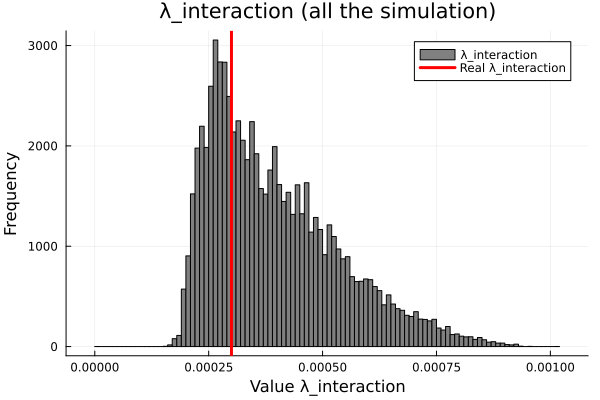

In [65]:
histogram(all_λ_interaction_4, label="λ_interaction", color=:gray)
vline!([λ_interaction],label="Real λ_interaction", lw=3, color=:red) # Add a vertical line
title!("λ_interaction (all the simulation)")
xlabel!("Value λ_interaction")
ylabel!("Frequency")

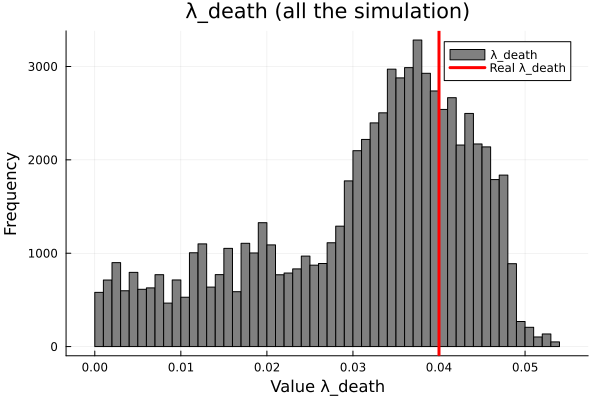

In [66]:
histogram(all_λ_death_4, label="λ_death", color=:gray)
vline!([λ_death],label="Real λ_death", lw=3, color=:red) # Add a vertical line
title!("λ_death (all the simulation)")
xlabel!("Value λ_death")
ylabel!("Frequency")

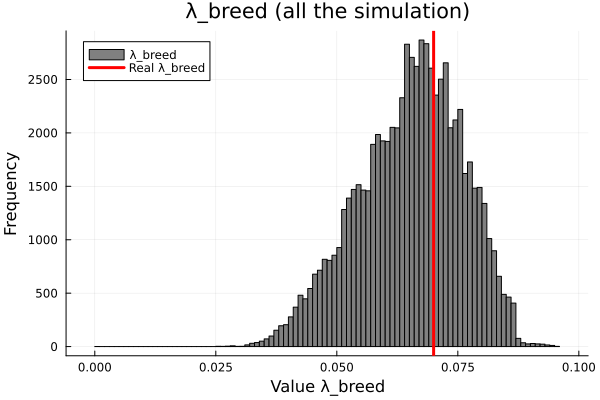

In [67]:
histogram(all_λ_breed_4, label="λ_breed", color=:gray)
vline!([λ_breed],label="Real λ_breed", lw=3, color=:red) # Add a vertical line
title!("λ_breed (all the simulation)")
xlabel!("Value λ_breed")
ylabel!("Frequency")

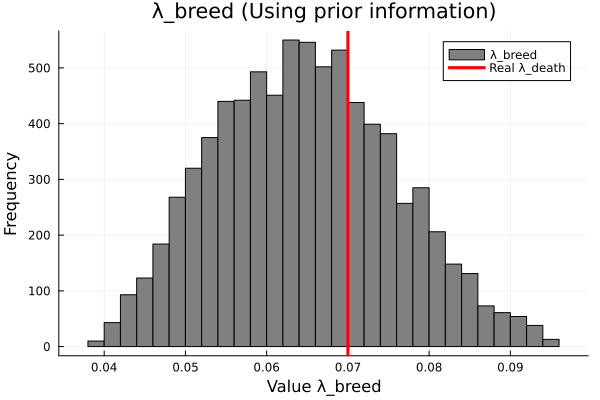

In [68]:
histogram(all_λ_breed_4[all_λ_breed_ip_in:all_λ_breed_ip_fin], label="λ_breed", color=:gray)
vline!([λ_breed],label="Real λ_death", lw=3, color=:red) # Add a vertical line
title!("λ_breed (Using prior information)")
xlabel!("Value λ_breed")
ylabel!("Frequency")

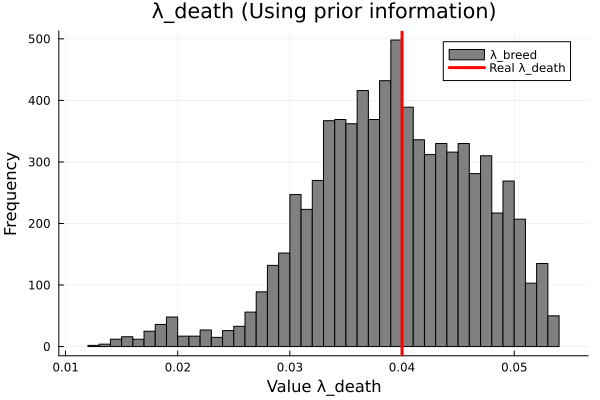

In [69]:
histogram(all_λ_death_4[all_λ_death_ip_in:all_λ_death_ip_fin], label="λ_breed", color=:gray)
vline!([λ_death],label="Real λ_death", lw=3, color=:red) # Add a vertical line
title!("λ_death (Using prior information)")
xlabel!("Value λ_death")
ylabel!("Frequency")

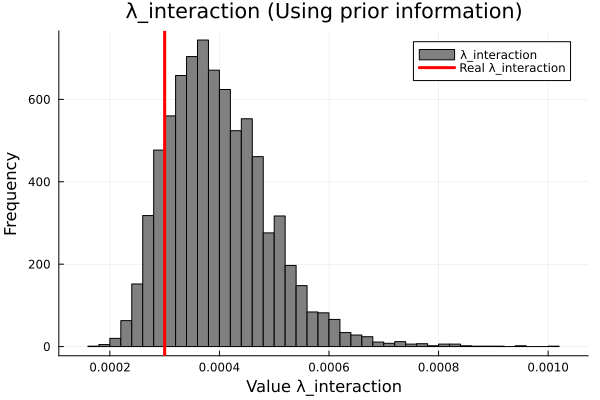

In [70]:
histogram(all_λ_interaction_4[all_λ_interaction_ip_in:all_λ_interaction_ip_fin], label="λ_interaction", color=:gray)
vline!([λ_interaction],label="Real λ_interaction", lw=3, color=:red) # Add a vertical line
title!("λ_interaction (Using prior information)")
xlabel!("Value λ_interaction")
ylabel!("Frequency")

# Appendix
Graphs of trials for parameter tuning. It could happen that the model diverges even if it is a result of the tuning parameter function.

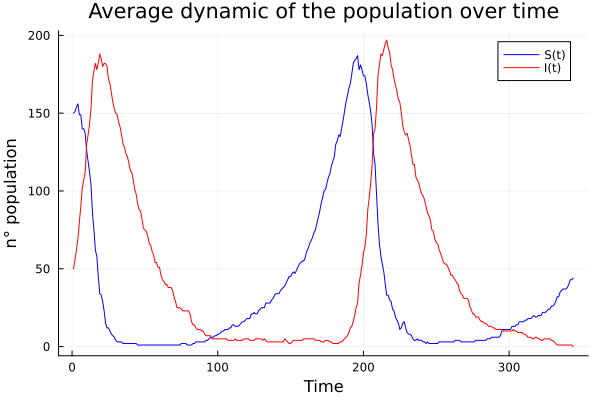

In [71]:
λ_interaction = 0.001
λ_death= 0.04
λ_breed= 0.04

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

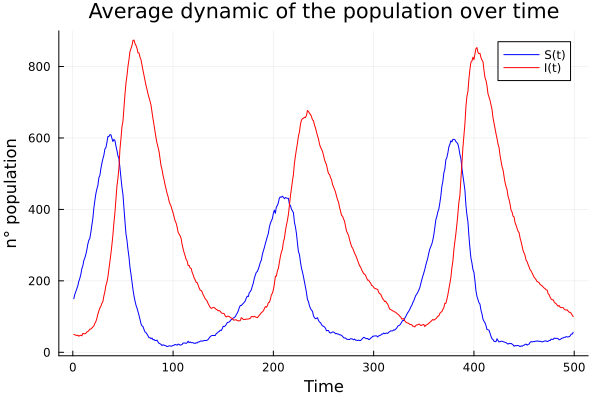

In [72]:
λ_interaction = 0.0002
λ_death= 0.03
λ_breed= 0.06

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

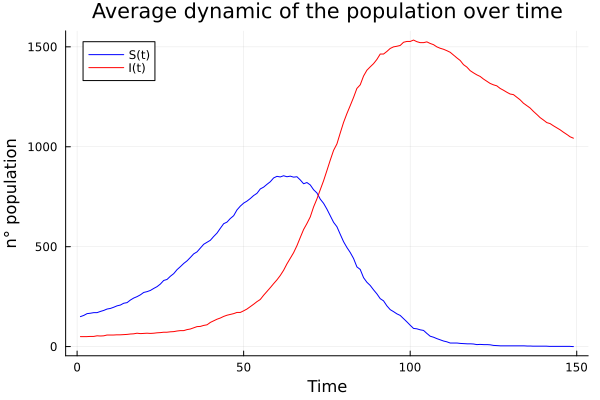

In [73]:
λ_interaction = 0.0001
λ_death= 0.01
λ_breed= 0.04

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

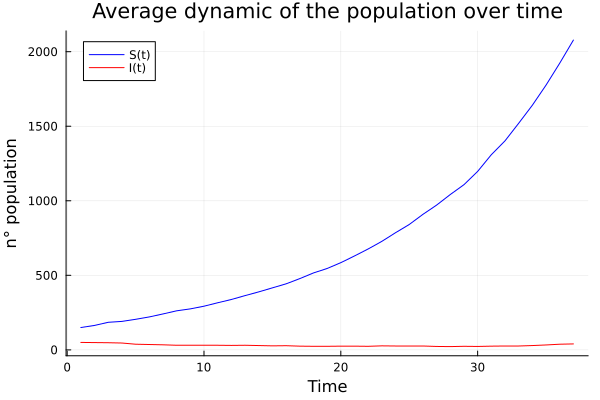

In [74]:
λ_interaction = 0.0001
λ_death= 0.08
λ_breed= 0.08

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

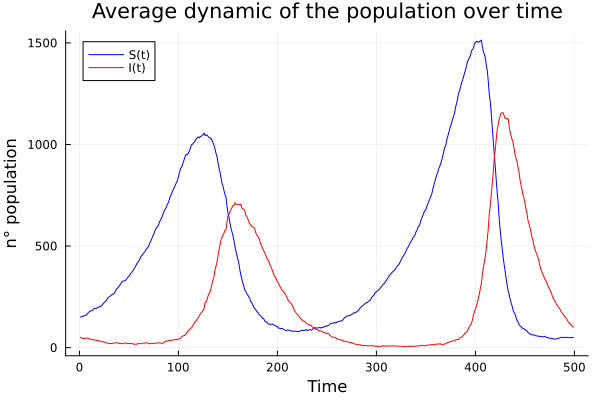

In [75]:
λ_interaction = 0.0001
λ_death= 0.04
λ_breed= 0.02

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

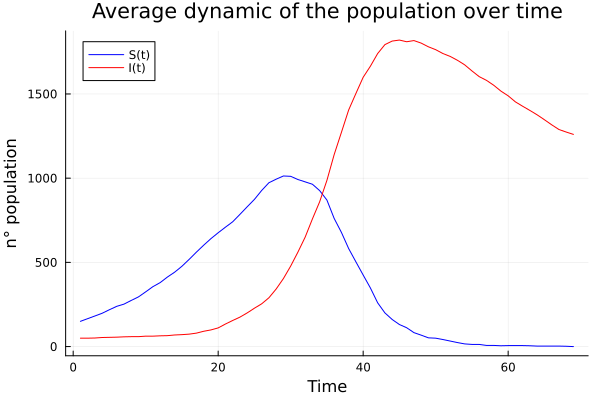

In [76]:
λ_interaction = 0.0002
λ_death= 0.02
λ_breed= 0.09

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

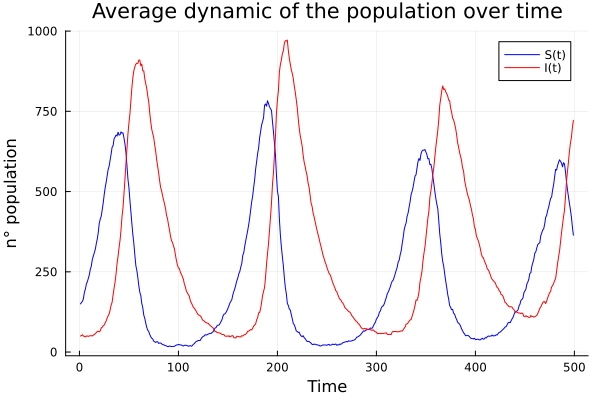

In [77]:
λ_interaction = 0.0002
λ_death= 0.04
λ_breed= 0.06

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

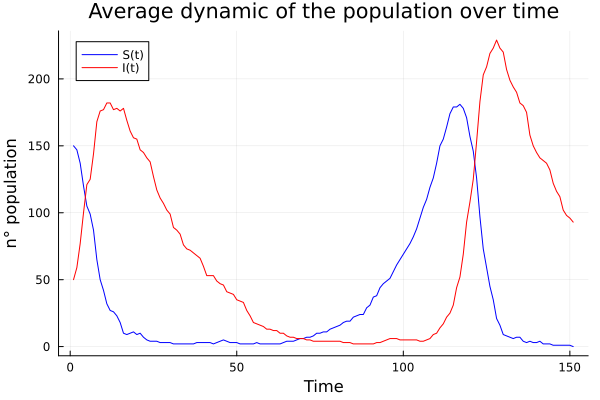

In [78]:
λ_interaction = 0.002
λ_death= 0.05
λ_breed= 0.08

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

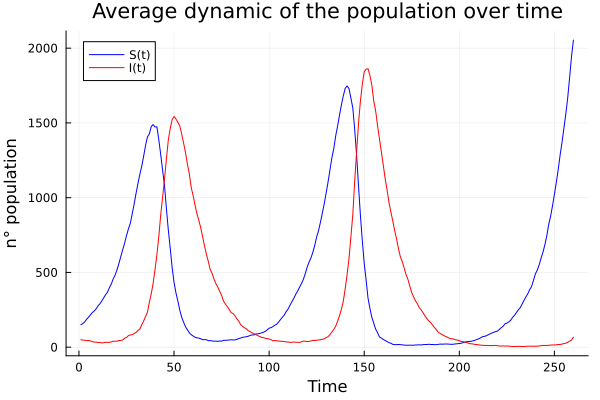

In [79]:
λ_interaction = 0.0002
λ_death= 0.08
λ_breed= 0.08

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

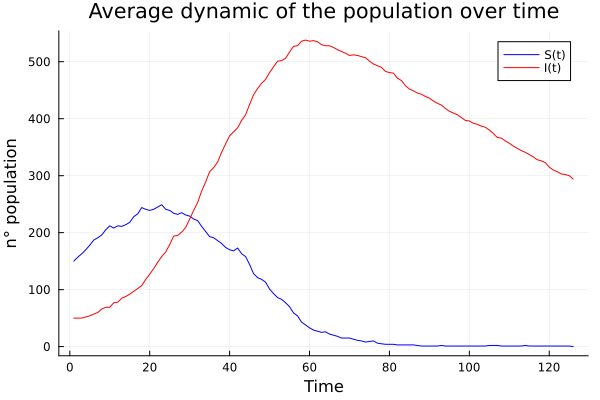

In [80]:
λ_interaction = 0.0003
λ_death= 0.01
λ_breed= 0.05

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

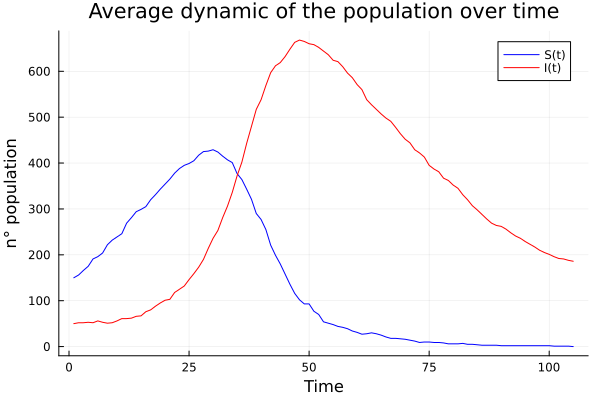

In [81]:
λ_interaction = 0.0003
λ_death= 0.03
λ_breed= 0.06

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

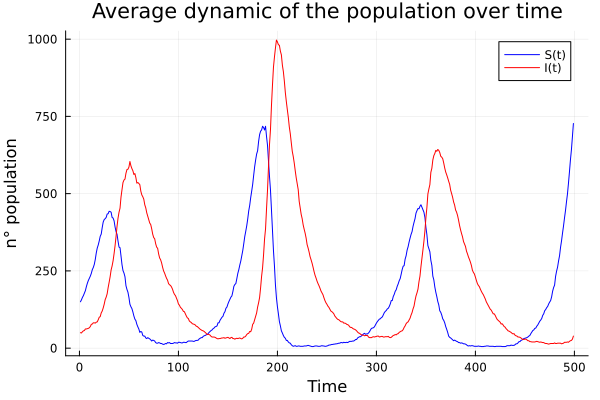

In [82]:
λ_interaction = 0.0003
λ_death= 0.04
λ_breed= 0.07

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

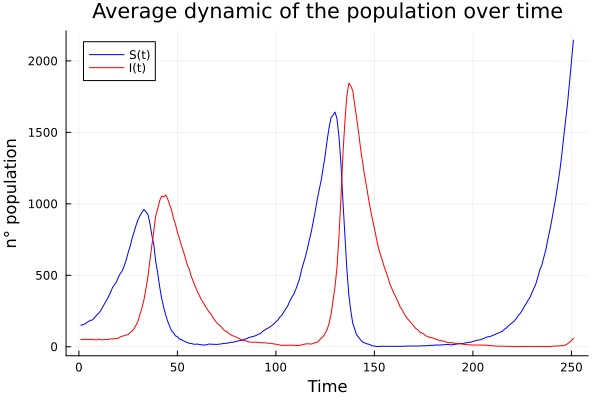

In [83]:
λ_interaction = 0.0003
λ_death= 0.08
λ_breed= 0.09

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

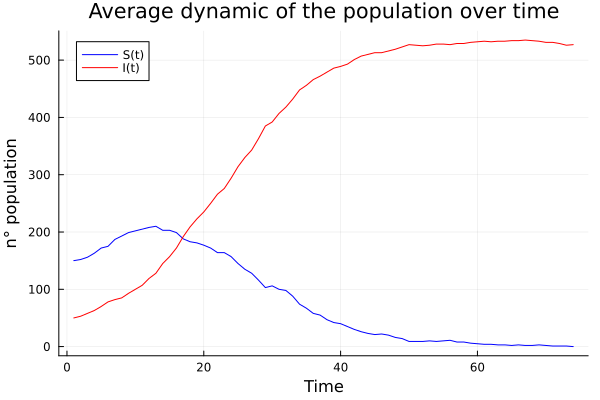

In [84]:
λ_interaction = 0.0004
λ_death= 0.002
λ_breed= 0.06

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

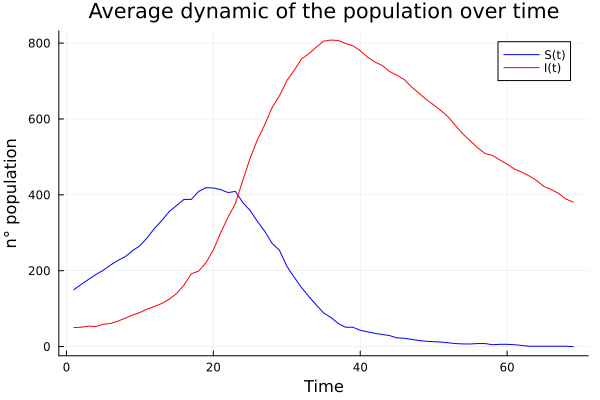

In [85]:
λ_interaction = 0.0004
λ_death= 0.03
λ_breed= 0.1

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

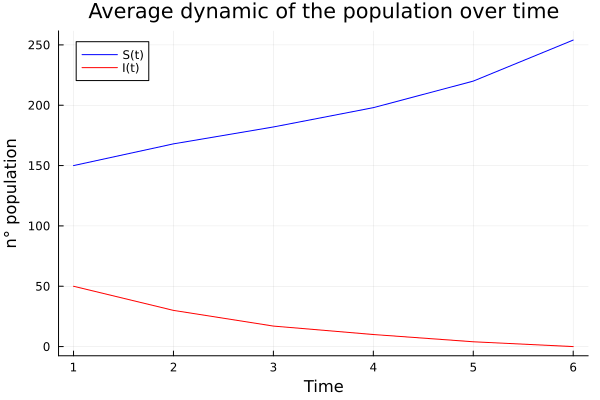

In [86]:
λ_interaction = 0.0004
λ_death= 0.5
λ_breed= 0.12

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

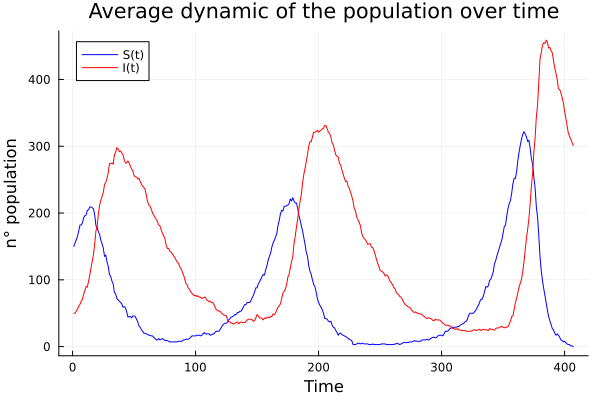

In [87]:
λ_interaction = 0.0005
λ_death= 0.03
λ_breed= 0.06

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

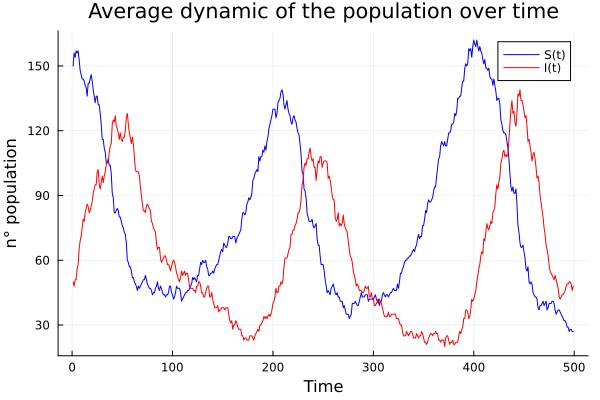

In [88]:
λ_interaction = 0.0005
λ_death= 0.04
λ_breed= 0.03

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

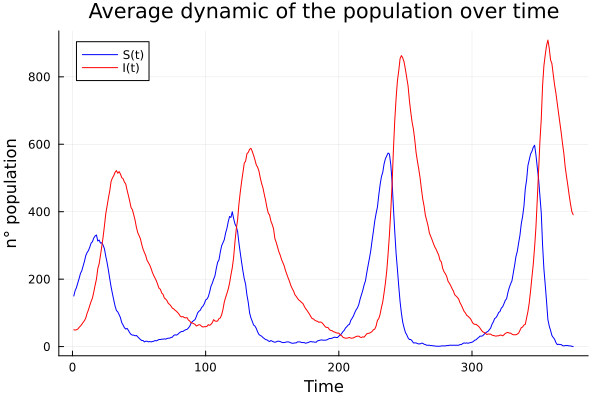

In [89]:
λ_interaction = 0.0005
λ_death= 0.05
λ_breed= 0.1

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

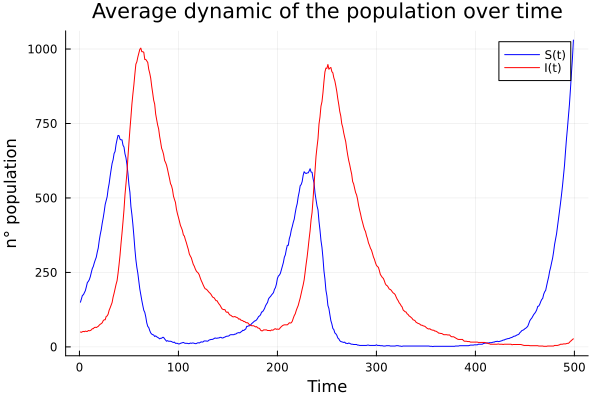

In [90]:
λ_interaction= 0.0002
λ_death= 0.03
λ_breed= 0.06

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

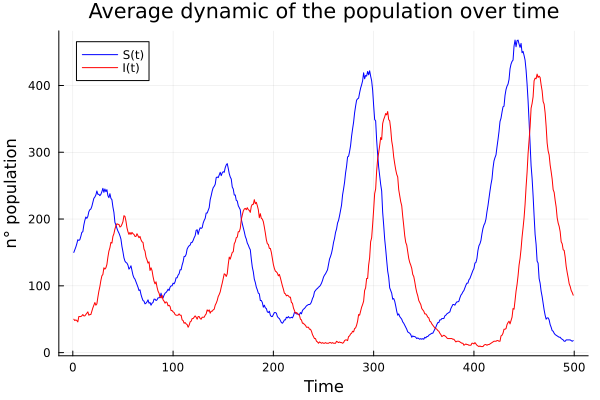

In [91]:
λ_interaction= 0.0004
λ_death= 0.06
λ_breed= 0.04

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)

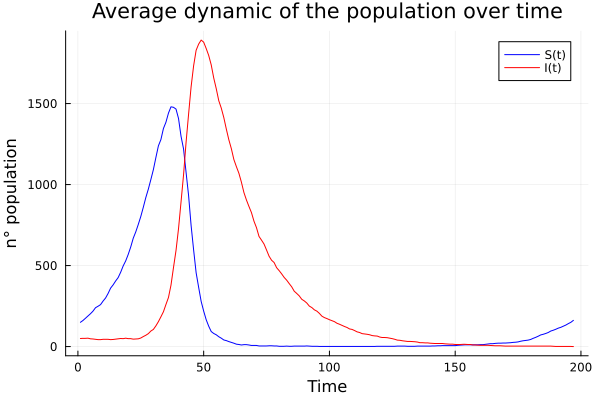

In [92]:
λ_interaction= 0.0002
λ_death= 0.05
λ_breed= 0.08

res = Lodka_num_parameter(N ,λ_interaction, λ_breed, λ_death, max_time, pz)
plot1 = nothing
plot1 = plot(res.nS, color=:blue, label="S(t)")
plot1 = plot!(res.nI, color=:red, label="I(t)")
plot1 = title!("Average dynamic of the population over time")
plot1 = xlabel!("Time")
plot1 = ylabel!("n° population")
plot(plot1, legend=true)